# **MODEL RESTORING**

In [ ]:
model_archi1_article=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/Archi1", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
model_archi2_article=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/Archi2", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
model_archi3_article=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/Archi3", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
model_archi1_all=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/Archi1_all", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
model_archi2_all=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/Archi2_all_contTR", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
model_archi3_all=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/Archi3_all", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
model_archi1_res=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/Archi1_Albumentation_Fast_Resnet_4_0", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)

## **Prediction on valens dataset**
(here we are using it as test set, no decision taken on these performances), it is just done so the results may be compared with the ensamble models

In [ ]:
#only TP aug
y_pred_valens1 = model_archi1_article.predict(valens_images_AR1)
y_pred_valens1 = np.asarray(y_pred_valens1)[:,0]
y_pred_valens2 = model_archi2_article.predict(valens_images_AR2)
y_pred_valens2 = np.asarray(y_pred_valens2)[:,0]
y_pred_valens3 = model_archi3_article.predict(valens_images_AR3)
y_pred_valens3 = np.asarray(y_pred_valens3)[:,0]
# all aug (18-2)
y_pred_valens1all = model_archi1_all.predict(valens_images_AR1)
y_pred_valens1all = np.asarray(y_pred_valens1all)[:,0]
y_pred_valens2all = model_archi2_all.predict(valens_images_AR2)
y_pred_valens2all = np.asarray(y_pred_valens2all)[:,0]
y_pred_valens3all = model_archi3_all.predict(valens_images_AR3)
y_pred_valens3all = np.asarray(y_pred_valens3all)[:,0]
# all aug and residual
#y_pred_valens1res = model_archi1_res.predict(valens_images_AR1)
#y_pred_valens1res = np.asarray(y_pred_valens1res)[:,0]

In [ ]:
#actually val_labels and valens_labels already available
y1 = np.array(h5file.root.target)
y_valens = y1[idx_valens]
y_val = y1[idx_val]

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score,precision_recall_curve,auc,roc_curve, f1_score 
import seaborn as sn

# **Evaluate Archi 1,2 and 3 on only TP augmentation**

## Confusion Matrix

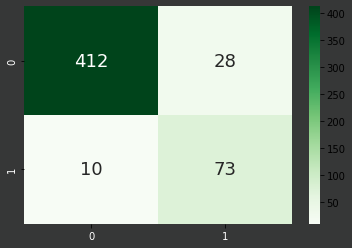

In [ ]:
#--Archi1 TP aug--

selected_thr = 0.5
# Confusion Matrix
CM1 = confusion_matrix(y_valens,y_pred_valens1>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CM1, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

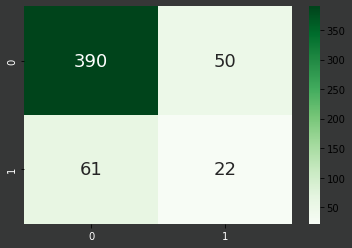

In [ ]:
#--Archi2 tp aug--

selected_thr = 0.5
# Confusion Matrix
CM2 = confusion_matrix(y_valens,y_pred_valens2>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CM2, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

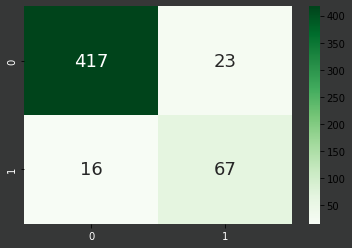

In [ ]:
#--Archi3 tp aug--

selected_thr = 0.5
# Confusion Matrix
CM3 = confusion_matrix(y_valens,y_pred_valens3>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CM3, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

## **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--Archi1 tp aug--

tn, fp, fn, tp = CM1.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens1>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens1>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

412
28
10
73
Acc: 0.9273422562141491
f1 score: 0.7934782608695651
(Se,Pr)=(0.88,0.72)


In [ ]:
#--Archi2 tp aug--

tn, fp, fn, tp = CM2.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens2>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens2>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

390
50
61
22
Acc: 0.7877629063097514
f1 score: 0.28387096774193554
(Se,Pr)=(0.27,0.31)


In [ ]:
#--Archi3 tp aug--

tn, fp, fn, tp = CM3.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens3>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens3>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

417
23
16
67
Acc: 0.9254302103250478
f1 score: 0.7745664739884394
(Se,Pr)=(0.81,0.74)


## **Curves PRC and ROC**

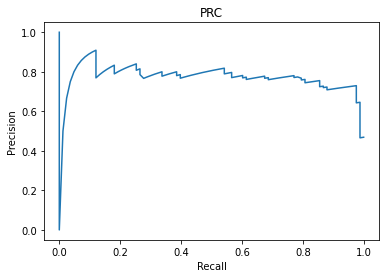

AUPRC TEST-SET : 0.7681


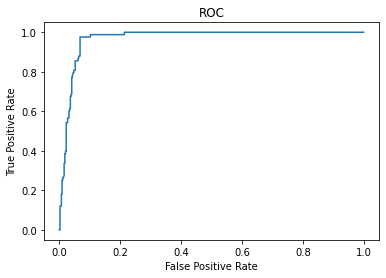

AUROC: 0.9686


In [ ]:
#--Archi 1 tp aug--

# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens1)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens1)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

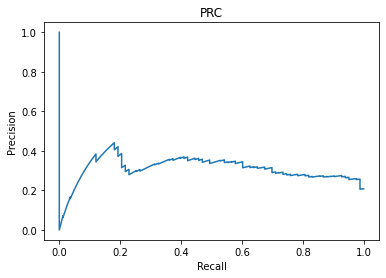

AUPRC TEST-SET : 0.3068


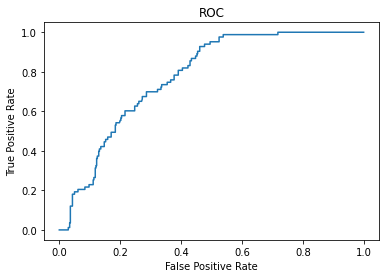

AUROC: 0.776


In [ ]:
#--Archi 2 tp aug--

# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens2)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens2)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

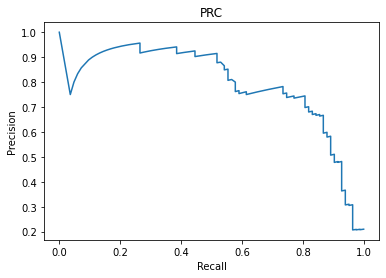

AUPRC TEST-SET : 0.7889


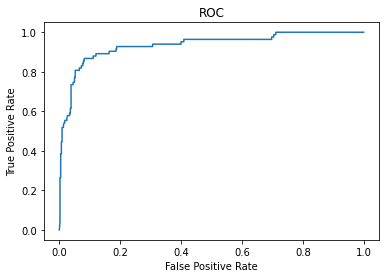

AUROC: 0.9343


In [ ]:
#--Archi 3 tp aug--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens3)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens3)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

# **Evaluate Archi 1,2,3 trained with advanced 18-2**

## Confusion Matrix

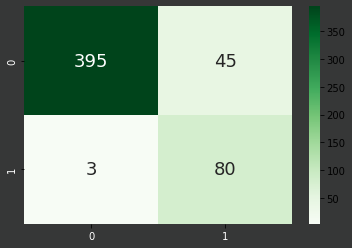

In [ ]:
#--Archi1 all--

selected_thr = 0.5
# Confusion Matrix
CM1 = confusion_matrix(y_valens,y_pred_valens1all>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CM1, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

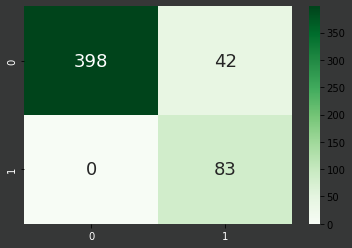

In [ ]:
#--Archi2 all--

selected_thr = 0.5
# Confusion Matrix
CM2 = confusion_matrix(y_valens,y_pred_valens2all>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CM2, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

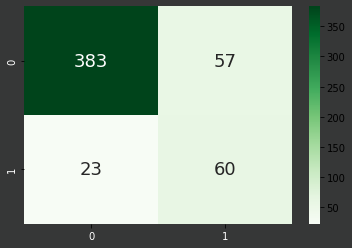

In [ ]:
#--Archi3 all--

selected_thr = 0.5
# Confusion Matrix
CM3 = confusion_matrix(y_valens,y_pred_valens3all>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CM3, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

## **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--Archi1 all--

tn, fp, fn, tp = CM1.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens1all>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens1all>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

395
45
3
80
Acc: 0.9082217973231358
f1 score: 0.7692307692307693
(Se,Pr)=(0.96,0.64)


In [ ]:
#--Archi2 all--

tn, fp, fn, tp = CM2.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens2all>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens2all>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

398
42
0
83
Acc: 0.9196940726577438
f1 score: 0.798076923076923
(Se,Pr)=(1.0,0.66)


In [ ]:
#--Archi3 all--

tn, fp, fn, tp = CM3.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens3all>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens3all>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

383
57
23
60
Acc: 0.847036328871893
f1 score: 0.6
(Se,Pr)=(0.72,0.51)


## **Curves PRC and ROC**

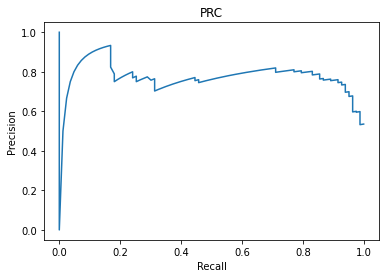

AUPRC TEST-SET : 0.7697


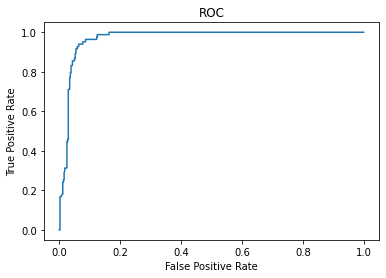

AUROC: 0.9696


In [ ]:
#--Archi 1 all--

# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens1all)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens1all)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

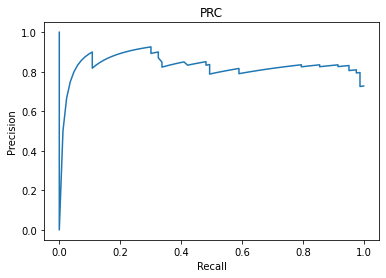

AUPRC TEST-SET : 0.8264


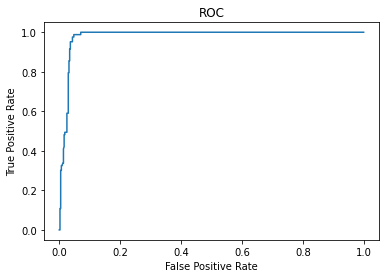

AUROC: 0.98


In [ ]:
#--Archi 2 all--

# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens2all)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens2all)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

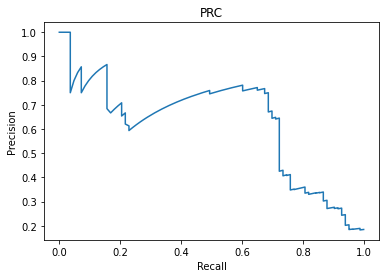

AUPRC TEST-SET : 0.6204


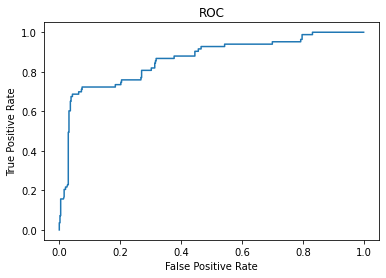

AUROC: 0.862


In [ ]:
#--Archi 3 all--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens3all)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens3all)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

# ResNet with field of view as archi1

## Confusion Matrix

In [ ]:
#--Archi1 all res--

selected_thr = 0.5
# Confusion Matrix
CM1 = confusion_matrix(y_valens,y_pred_valens1res>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CM1, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

## **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--Archi1 all res--

tn, fp, fn, tp = CM1.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens1res>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens1res>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

## **Curves PRC and ROC**

In [ ]:
#--Archi 1 all res--

# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens1res)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens1res)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

# Multimodal Networks

# **Multimodal network**
###Parallel convolutional branches until classifier
After having tuned each archi model's parameters, the idea is to replicate their convolutional parts, feed them with their field of view and then have a common classifier (increased complexity) use ALL of the extracted features: regarding only the lesion, its immediate surroundings and its contest for archi 1,2,3 respectively in order obtain a more robust prediction and possibly increase overall performance

In [ ]:
#@markdown ## Hyperparameters:
epochs =  70#@param {type:"number"}
dropout_archi1 = 0.3 #@param {type:"number"}
dropout_archi2 = 0.3 #@param {type:"number"}
dropout_archi3 = 0.4 #@param {type:"number"}
dropout_classifier= 0.5 #@param {type:"number"}

In [ ]:
# MODEL  DEFINITION
#multi-modal network
def build_multimodal_2dense (): 
    
    input_layer_AR1 = keras.layers.Input(shape = archi1_input_shape)
    input_layer_AR2 = keras.layers.Input(shape = archi2_input_shape)
    input_layer_AR3 = keras.layers.Input(shape = archi3_input_shape)
    

    #AR1
    conv11 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(input_layer_AR1)
    pool11 = keras.layers.MaxPooling3D(
        pool_size = (1,1,1)
        )(conv11)
    pool11 = keras.layers.Dropout(dropout_archi1, seed=seed)(pool11)

    conv21 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(pool11)

    conv31 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(conv21)
    
    flattening_layer_AR1 = keras.layers.GlobalMaxPool3D()(conv31)
    flattening_layer_AR1 = keras.layers.Dropout(dropout_archi1, seed=seed)(flattening_layer_AR1)

    #AR2
    conv12 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(input_layer_AR2)
    pool12 = keras.layers.MaxPooling3D(
        pool_size = (1,2,2)
        )(conv12)
    pool12 = keras.layers.Dropout(dropout_archi2, seed=seed)(pool12)

    conv22 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(pool12)

    conv32 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(conv22)
    
    flattening_layer_AR2 = keras.layers.GlobalMaxPool3D()(conv32)
    flattening_layer_AR2 = keras.layers.Dropout(dropout_archi2, seed=seed)(flattening_layer_AR2)
    
    
    #AR3
    conv13 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(input_layer_AR3)
    pool13 = keras.layers.MaxPooling3D(
        pool_size = (2,2,2)
        )(conv13)
    pool13 = keras.layers.Dropout(dropout_archi3, seed=seed)(pool13)

    conv23 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(pool13)

    conv33 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(conv23)
    
    flattening_layer_AR3 = keras.layers.GlobalMaxPool3D()(conv33)
    flattening_layer_AR3 = keras.layers.Dropout(dropout_archi3, seed=seed)(flattening_layer_AR3)

    #concatenate 3 outputs
    concatenation_layer= keras.layers.Concatenate()([flattening_layer_AR1,flattening_layer_AR2,flattening_layer_AR3])
    
    classifier_layer = keras.layers.Dense(units=256, kernel_initializer=keras.initializers.GlorotUniform(seed), activation='relu')(concatenation_layer)
    classifier_layer = keras.layers.Dropout(dropout_classifier, seed=seed)(classifier_layer)
    classifier_layer = keras.layers.Dense(units=128, kernel_initializer=keras.initializers.GlorotUniform(seed), activation='relu')(classifier_layer)
    classifier_layer = keras.layers.Dropout(dropout_classifier, seed=seed)(classifier_layer)
    output_layer = keras.layers.Dense(units=2, activation='softmax', kernel_initializer=keras.initializers.GlorotUniform(seed))(classifier_layer)

    # Connect input and output through the Model class
    model = keras.Model(inputs=[input_layer_AR1,input_layer_AR2,input_layer_AR3],
                    outputs=output_layer,
                    name="multimodal_model")

    # Compile the model
    model.compile(loss=custom_crossentropy(bce), optimizer=adam, metrics=['acc',recall,precision,f1score]) 

    # Return the model
    return model

In [ ]:
multimodel= build_multimodal_2dense ()

In [ ]:
multimodel.summary()

Model: "multimodal_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 6, 20, 20,   0           []                               
                                1)]                                                               
                                                                                                  
 input_5 (InputLayer)           [(None, 10, 30, 30,  0           []                               
                                 1)]                                                              
                                                                                                  
 input_6 (InputLayer)           [(None, 26, 40, 40,  0           []                               
                                 1)]                                               

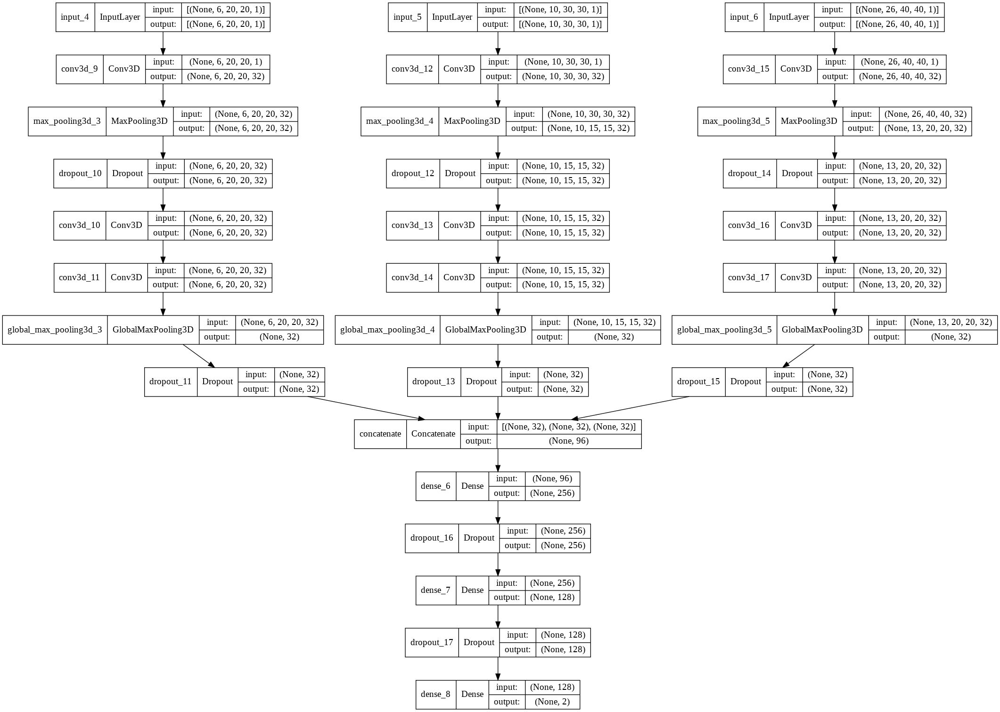

In [ ]:
plot_model(multimodel,show_shapes=True, show_layer_names=True)

In [ ]:
#to deal with data imbalance, before balanced augmentation, balanced loss was attemped: this corresponds to a greater weight update magnitude for 
#missclassifications of the minority class with respect to misscalassifications of the majority one
'''
from sklearn.utils import class_weight
train_labels_decoded = np.argmax(y[idx_train], axis=1) #decode from 1 hot encoding
class_weights_alt = class_weight.compute_class_weight(
            class_weight='balanced', 
            classes=np.unique(train_labels_decoded),
            y=train_labels_decoded)
class_weights_alt = dict(enumerate(class_weights_alt))
'''

In [ ]:
training_generator3 = imageLoader_ensemble(h5file, idx_angles_training, y, batch_size)

(8442, 2)
 array([[2123,    0],
       [3498,    0],
       [5467,  180],
       ...,
       [2092,    0],
       [4487,    0],
       [1697,    0]])
Epoch 1/40
84/84 [==============================] - 104s 1s/step - loss: 0.6680 - acc: 0.5910 - recall: 0.4198 - precision: 0.6078 - f1score: 0.4464 - val_loss: 0.5843 - val_acc: 0.6597 - val_recall: 0.8004 - val_precision: 0.3103 - val_f1score: 0.4063 - lr: 0.0010
Epoch 2/40
84/84 [==============================] - 93s 1s/step - loss: 0.4625 - acc: 0.7918 - recall: 0.7923 - precision: 0.8050 - f1score: 0.7845 - val_loss: 0.3109 - val_acc: 0.9082 - val_recall: 0.6888 - val_precision: 0.6687 - val_f1score: 0.6260 - lr: 0.0010
Epoch 3/40
84/84 [==============================] - 92s 1s/step - loss: 0.2772 - acc: 0.8920 - recall: 0.8671 - precision: 0.9121 - f1score: 0.8856 - val_loss: 0.2530 - val_acc: 0.9120 - val_recall: 0.6335 - val_precision: 0.6443 - val_f1score: 0.6068 - lr: 0.0010
Epoch 4/40
84/84 [==============================] - 93

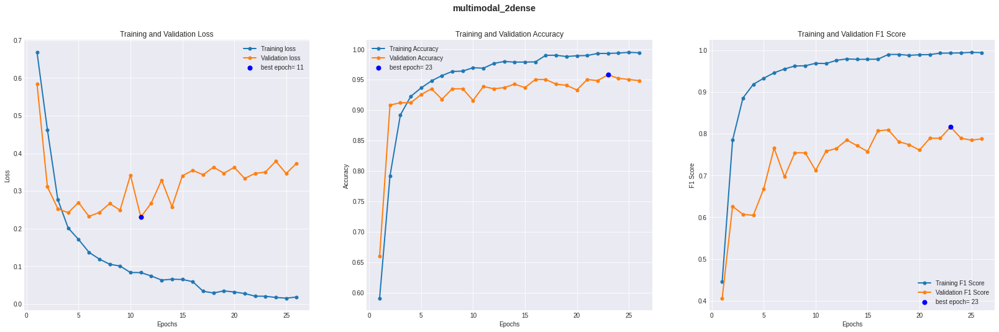

In [ ]:
#just TP augmentation
my_model_name='multimodal_2dense'
(my_callbacks, exp_dir) = create_folders_and_callbacks(model_name=my_model_name)
historymulti = multimodel.fit(x= training_generator3,   # give the generator as input data
          validation_data = ([valens_images_AR1,valens_images_AR2,valens_images_AR3],valens_labels), # give directly all images and labels for the validation set. "model.fit" doesn't accept a generator as input to validation_data; Use model.fit_generator if you need a generator also for the validation set
          epochs = epochs, steps_per_epoch = steps,
          callbacks=my_callbacks
          )

#Plot
resume_plot(historymulti, exp_dir, my_model_name)
#Animation
animated_plot(historymulti, repeat_animation=False)

Epoch 1/70
168/168 [==============================] - 372s 2s/step - loss: 0.5724 - acc: 0.6980 - recall: 0.6797 - precision: 0.7136 - f1score: 0.6745 - val_loss: 0.3382 - val_acc: 0.9273 - val_recall: 0.6727 - val_precision: 0.6860 - val_f1score: 0.6614 - lr: 0.0010
Epoch 2/70
168/168 [==============================] - 322s 2s/step - loss: 0.3581 - acc: 0.8501 - recall: 0.8368 - precision: 0.8633 - f1score: 0.8428 - val_loss: 0.1796 - val_acc: 0.9388 - val_recall: 0.7857 - val_precision: 0.7898 - val_f1score: 0.7628 - lr: 0.0010
Epoch 3/70
168/168 [==============================] - 317s 2s/step - loss: 0.2625 - acc: 0.8930 - recall: 0.8922 - precision: 0.8941 - f1score: 0.8894 - val_loss: 0.1732 - val_acc: 0.9388 - val_recall: 0.9265 - val_precision: 0.7242 - val_f1score: 0.7860 - lr: 0.0010
Epoch 4/70
168/168 [==============================] - 320s 2s/step - loss: 0.2229 - acc: 0.9127 - recall: 0.9154 - precision: 0.9090 - f1score: 0.9100 - val_loss: 0.1617 - val_acc: 0.9713 - val_re

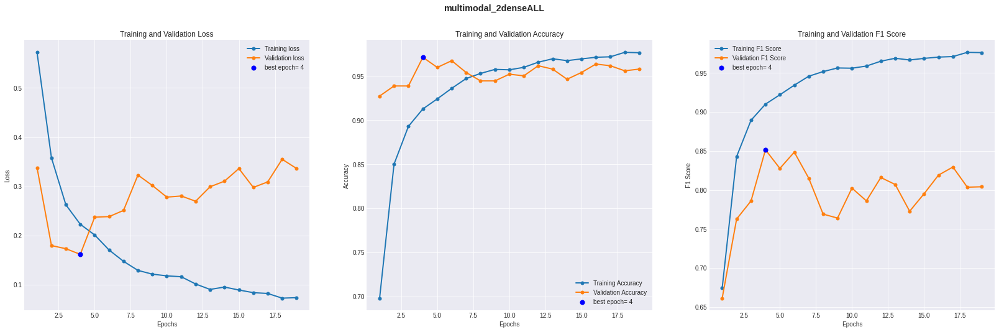

In [ ]:
#all augmentation
#even with an augmented dataset the model overfits more than the simplesr single archis, this could be due due, not only to the increase of parameters due to the 3 parallel branches but 
#also to the considerable increase of parameters given by the addition of a dense layer
my_model_name='multimodal_2denseALL'
(my_callbacks, exp_dir) = create_folders_and_callbacks(model_name=my_model_name)
historymulti = multimodel.fit(x= training_generator3,   # give the generator as input data
          validation_data = ([valens_images_AR1,valens_images_AR2,valens_images_AR3],valens_labels), # give directly all images and labels for the validation set. "model.fit" doesn't accept a generator as input to validation_data; Use model.fit_generator if you need a generator also for the validation set
          epochs = epochs, steps_per_epoch = steps,
          callbacks=my_callbacks
          )

#Plot
resume_plot(historymulti, exp_dir, my_model_name)
#Animation
animated_plot(historymulti, repeat_animation=False)

In [ ]:
multimodel.save(os.path.join(exps_dir, str('best_model/' +  my_model_name))) 
#model_archi3_article.save('./archi3_bal__article.h5')
#model_archi3_article.save('./Task1/archi3_bal_article_sure.h5')
#model_archi3_article.save_weights('./Task1/archi3_bal_article_weights.h5')
#model_archi3_article.save_weights('./archi3_bal_article_weights_bu.h5')
#model_archi3_article.save('./Task1/archi3_bal_article_gaus.h5')
#model_archi3_article.save_weights('./archi3_bal_article_weights_gaus.h5')

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/multimodal_2denseALL/assets


In [ ]:
multimodel=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/multimodal_2dense", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
multimodelALL=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/multimodal_2denseALL", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)

### **Prediction on valens dataset**

In [ ]:
#TP aug
y_pred_valens_multi = multimodel.predict([valens_images_AR1,valens_images_AR2,valens_images_AR3])
y_pred_valens_multi = np.asarray(y_pred_valens_multi)[:,0]

In [ ]:
#all aug
y_pred_valens_multiALL = multimodelALL.predict([valens_images_AR1,valens_images_AR2,valens_images_AR3])
y_pred_valens_multiALL = np.asarray(y_pred_valens_multiALL)[:,0]

## Evaluate the multimodal network treined on the balanced training set by augmenting only TP samples

## Confusion Matrix

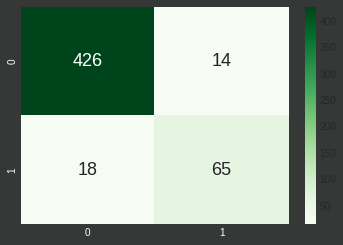

NameError: ignored

In [ ]:
#--Multimodal model--
selected_thr = 0.5
# Confusion Matrix
CMmulti = confusion_matrix(y_valens,y_pred_valens_multi>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMmulti, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

## **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--multimodal model--
tn, fp, fn, tp = CMmulti.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_multi>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens_multi>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

426
14
18
65
Acc: 0.9388145315487572
f1 score: 0.8024691358024693
(Se,Pr)=(0.78,0.82)


## **Curves PRC and ROC**

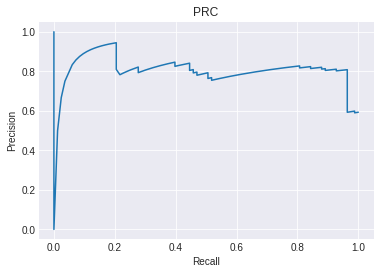

AUPRC TEST-SET : 0.8017


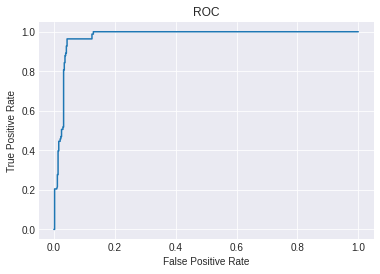

AUROC: 0.9747


In [ ]:
#--multimodal model--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_multi)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_multi)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

## Evaluate the multimodal network treined on the balanced training set by augmenting all classes


## Confusion Matrix

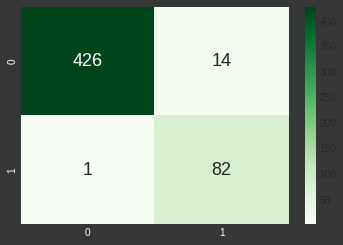

In [ ]:
#--Multimodal model ALL--
selected_thr = 0.5
# Confusion Matrix
CMmulti = confusion_matrix(y_valens,y_pred_valens_multiALL>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMmulti, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

## **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--multimodal model ALL--
tn, fp, fn, tp = CMmulti.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_multiALL>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens_multiALL>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

426
14
1
82
Acc: 0.97131931166348
f1 score: 0.9162011173184358
(Se,Pr)=(0.99,0.85)


## **Curves PRC and ROC**

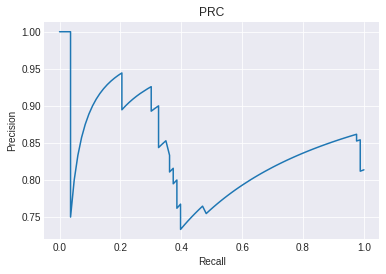

AUPRC TEST-SET : 0.843


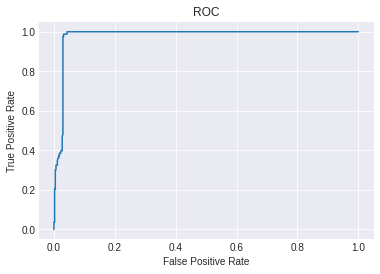

AUROC: 0.9801


In [ ]:
#--multimodal model ALL--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_multiALL)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_multiALL)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

# **Multimodal network**
### parallel convolutional branches - common convolution - classifier
The rationale behind this other type of multimodal network is to see if the issue that prevented the previous one from outperforming the single archis could be due to the parameters added by the bigger classifier which caused overfitting to prevent increasing performance on validation.
And also, the common convolutional layer might allow the extraction of spatially localized features extracted from each branch 


In [ ]:
#@markdown ## Hyperparameters:
epochs =  50#@param {type:"number"}
dropout_archi1 = 0.3 #@param {type:"number"}
dropout_archi2 = 0.4 #@param {type:"number"}
dropout_archi3 = 0.5 #@param {type:"number"}
dropout_classifier= 0.5 #@param {type:"number"}

In [ ]:
# MODEL  DEFINITION
#multi-modal network
def build_multimodal_conv (): 
    
    input_layer_AR1 = keras.layers.Input(shape = (10, 20,20,1)) #modfied for concatenation
    input_layer_AR2 = keras.layers.Input(shape = archi2_input_shape)
    input_layer_AR3 = keras.layers.Input(shape = (20,40,40,1))
    

    #AR1
    conv11 = keras.layers.Conv3D(
        filters=16, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(input_layer_AR1)
    pool11 = keras.layers.MaxPooling3D(
        pool_size = (1,1,1)
        )(conv11)
    pool11 = keras.layers.Dropout(dropout_archi1, seed=seed)(pool11)

    conv21 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(pool11)

    conv31 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(conv21)
    pool21 = keras.layers.MaxPooling3D(
        pool_size = (1,2,2)
        )(conv31)
    flattening_layer_AR1 = keras.layers.Dropout(dropout_archi1, seed=seed)(pool21)

    #AR2
    conv12 = keras.layers.Conv3D(
        filters=16, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(input_layer_AR2)
    pool12 = keras.layers.MaxPooling3D(
        pool_size = (1,1,1)
        )(conv12)
    pool12 = keras.layers.Dropout(dropout_archi2, seed=seed)(pool12)

    conv22 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(pool12)

    conv32 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(conv22)
    pool22 = keras.layers.MaxPooling3D(
        pool_size = (1,3,3)
        )(conv32)
    flattening_layer_AR2 = keras.layers.Dropout(dropout_archi2, seed=seed)(pool22)
    
    
    #AR3
    conv13 = keras.layers.Conv3D(
        filters=16, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(input_layer_AR3)
    pool13 = keras.layers.MaxPooling3D(
        pool_size = (2,2,2)
        )(conv13)
    pool13 = keras.layers.Dropout(dropout_archi3, seed=seed)(pool13)

    conv23 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(pool13)

    conv33 = keras.layers.Conv3D(
        filters=32, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(conv23)
    pool23 = keras.layers.MaxPooling3D(
        pool_size = (1,2,2)
        )(conv33)
    flattening_layer_AR3 = keras.layers.Dropout(dropout_archi3, seed=seed)(pool23)

    #concatenate 3 outputs
    concatenation_layer= keras.layers.Concatenate()([flattening_layer_AR1,flattening_layer_AR2,flattening_layer_AR3])
    
    #conv layer to all 3 outputs concatenated
    convFull = keras.layers.Conv3D(
        filters=64, kernel_size=(3,5,5), padding='same',
        #data_format="channels_last", 
        activation="relu",
        kernel_initializer=keras.initializers.GlorotUniform(seed)
        )(concatenation_layer)
    convFull= keras.layers.GlobalMaxPool3D()(convFull)
    convFull = keras.layers.Dropout(dropout_classifier, seed=seed)(convFull)
    
    classifier_layer = keras.layers.Dense(units=250, kernel_initializer=keras.initializers.GlorotUniform(seed), activation='relu')(convFull)
    classifier_layer = keras.layers.Dropout(dropout_classifier, seed=seed)(classifier_layer)
    #classifier_layer = keras.layers.Dense(units=128, kernel_initializer=keras.initializers.GlorotUniform(seed), activation='relu')(classifier_layer)
    #classifier_layer = keras.layers.Dropout(dropout_classifier, seed=seed)(classifier_layer)
    output_layer = keras.layers.Dense(units=2, activation='softmax', kernel_initializer=keras.initializers.GlorotUniform(seed))(classifier_layer)

    # Connect input and output through the Model class
    model = keras.Model(inputs=[input_layer_AR1,input_layer_AR2,input_layer_AR3],
                    outputs=output_layer,
                    name="multimodal_model")

    # Compile the model
    model.compile(loss=custom_crossentropy(bce), optimizer=adam, metrics=['acc',recall,precision,f1score]) 

    # Return the model
    return model

In [ ]:
multimodel_c= build_multimodal_conv()

In [ ]:
multimodel_c.summary()

Model: "multimodal_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 10, 20, 20,  0           []                               
                                 1)]                                                              
                                                                                                  
 input_23 (InputLayer)          [(None, 10, 30, 30,  0           []                               
                                 1)]                                                              
                                                                                                  
 input_24 (InputLayer)          [(None, 20, 40, 40,  0           []                               
                                 1)]                                               

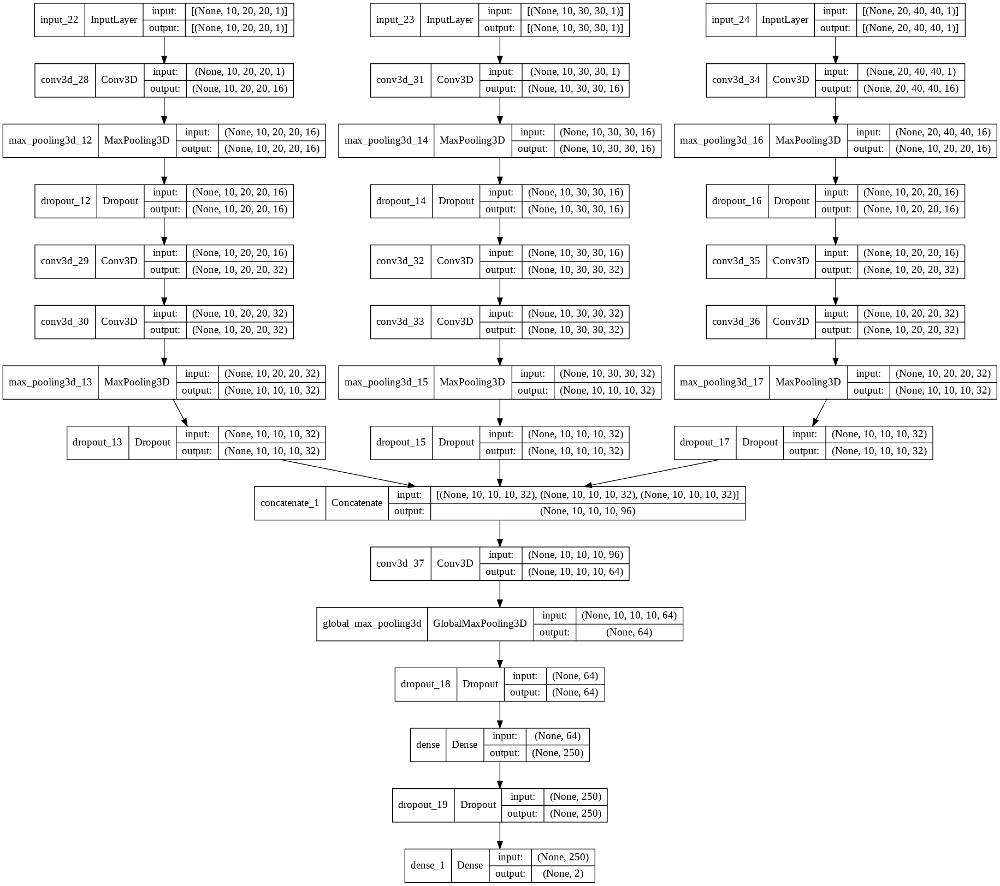

In [ ]:
plot_model(multimodel_c,show_shapes=True, show_layer_names=True)

In [ ]:
#a specific image loader is necessary since global max pooling is not applied before concatenation in order to allow the common convolutional layer to 
#combine spatial features from each branch in a localized manner
if augment_what == "just_TP":
  def imageLoader_ensembleMOD(files, idx_samples,target, batch_size):
      L = len(idx_samples)
      #random.shuffle(idx_samples)
      
      print(idx_samples.shape)
      idx_samples = K.print_tensor(idx_samples)
      np.random.shuffle(idx_samples)
      
      while True:
          batch_start = 0
          batch_end = batch_size

          while batch_end <= L:
              limit = min(batch_end, L)

              tmpB_AR1 = np.empty((limit-batch_start,10,20,20))
              tmpB_AR2 = np.empty((limit-batch_start,10,30,30))
              tmpB_AR3 = np.empty((limit-batch_start,20,40,40))
              tmpB_Y = np.empty((limit-batch_start,2)) #new
              
              idx =-1
              for i in range(batch_start,limit):
                  idx=idx+1
                  # Ranges has to be updated according to the input size we are dealing with
                  
                  img_A1 =  np.expand_dims(files.root.images[idx_samples[i,0],8:18,10:30,10:30],axis=0) #i,0 #9:15,14:34,14:34
                  img_A2 =  np.expand_dims(files.root.images[idx_samples[i,0],8:18,5:35,5:35],axis=0) #7:17,9:39,9:39
                  img_A3 =  np.expand_dims(files.root.images[idx_samples[i,0],3:23,:,:],axis=0) #:,4:44,4:44

                  # image processing
                  img_A1 = normalize(img_A1)
                  img_A2 = normalize(img_A2)
                  img_A3 = normalize(img_A3)
                  
                  # from the value in the second column verify which transformation apply 
                  angle = idx_samples[i,1] #i
                  if angle == 1:
                      img_A1 = np.flip(img_A1,axis=3) # horizontal FLIP 
                      img_A2 = np.flip(img_A2,axis=3) # horizontal FLIP
                      img_A3 = np.flip(img_A3,axis=3) # horizontal FLIP
                  elif angle ==2:
                      img_A1 = np.flip(img_A1,axis=2) # vertical FLIP 
                      img_A2 = np.flip(img_A2,axis=2) # vertical FLIP 
                      img_A3 = np.flip(img_A3,axis=2) # vertical FLIP 
                  elif angle >2 :
                      img_A1 = ndimage.rotate(img_A1,angle,reshape=False,mode='constant',axes = (2,3))
                      img_A2 = ndimage.rotate(img_A2,angle,reshape=False,mode='constant',axes = (2,3))
                      img_A3 = ndimage.rotate(img_A3,angle,reshape=False,mode='constant',axes = (2,3))
                  elif angle == 0: # original image is considered
                      img_A1 = img_A1
                      img_A2 = img_A2
                      img_A3 = img_A3


                  # fill the allocated vector with the tranformed image
                  tmpB_AR1[idx,:,:,:] =img_A1
                  tmpB_AR2[idx,:,:,:] =img_A2
                  tmpB_AR3[idx,:,:,:] =img_A3
                  tmpB_Y[idx,:] = target[idx_samples[i,0],:] #new


              X_AR1 = np.expand_dims(tmpB_AR1,axis=-1)
              X_AR2 = np.expand_dims(tmpB_AR2,axis=-1)
              X_AR3 = np.expand_dims(tmpB_AR3,axis=-1)
              #Y = target[idx_samples[batch_start:limit],0] # ,0 in ]
              Y = tmpB_Y 

              yield ([X_AR1,X_AR2,X_AR3] ,Y)    

              batch_start += batch_size   
              batch_end += batch_size            

elif augment_what == "all":
    print("all classes augmented")
    def imageLoader_ensembleMOD(files, idx_samples,target, batch_size):
      L = len(idx_samples)
      #random.shuffle(idx_samples)
      
      print(idx_samples.shape)
      idx_samples = K.print_tensor(idx_samples)
      np.random.shuffle(idx_samples)
      
      while True:
          batch_start = 0
          batch_end = batch_size

          while batch_end <= L:
              limit = min(batch_end, L)

              # we have to allocate in advance the space for the input batch
              tmpB_AR1 = np.empty((limit-batch_start,10,20,20))  #<------------------------------------------------------------------ARCHI 1 SHAPE
              tmpB_AR2 = np.empty((limit-batch_start,10,30,30)) #<------------------------------------------------------------------ARCHI 2 SHAPE
              tmpB_AR3 = np.empty((limit-batch_start,20,40,40)) #<------------------------------------------------------------------ARCHI 3 SHAPE
              tmpB_Y = np.empty((limit-batch_start,2))
              
              idx =-1
              for i in range(batch_start,limit):
                  idx=idx+1
                  # Ranges has to be updated according to the input size we are dealing with
                  # Limitation: only the center is considered, what if nodule at border'''

                  img_A1 =  np.expand_dims(files.root.images[idx_samples[i,0],8:18,10:30,10:30],axis=0)  #<----------------------------------ARCHI 3 CENTER
                  img_A2 =  np.expand_dims(files.root.images[idx_samples[i,0],8:18,5:35,5:35],axis=0)  #<----------------------------------ARCHI 3 CENTER
                  img_A3 =  np.expand_dims(files.root.images[idx_samples[i,0],3:23,:,:],axis=0) #<----------------------------------ARCHI 3 CENTER
                  
                  # image processing
                  img_A1 = normalize(img_A1)
                  img_A2 = normalize(img_A2)
                  img_A3 = normalize(img_A3)
                  # from the value in the second column verify which transformation apply 
                  angle = idx_samples[i,1]



                  if angle >= 1:
                      # AUGMENTATION!!-------------------------------------------------------------------------------------------------------------------           
                      
                      # Extract the number of slices
                      n_slices1 = img_A1.shape[1]
                      n_slices2 = img_A2.shape[1]
                      n_slices3 = img_A3.shape[1]

                      # generation of the dictionary to pass at the augmentation function
                      targets_dict = {}
                      
                      for k in range(n_slices1+n_slices2+n_slices3):  
                        targets_dict[str('image'+str(k))] = 'image'
                  
                      # Extraction of the slices to augment
                      slices1 = [] #<----------------------------------------Archi 1
                      for j1 in range(n_slices1):
                        im_slice1 = img_A1[:,j1,:,:]
                        slices1.append(np.squeeze(im_slice1))
                      
                      # Extraction of the slices to augment
                      slices2 = [] #<----------------------------------------Archi 2
                      for j2 in range(n_slices2):
                        im_slice2 = img_A2[:,j2,:,:]
                        slices2.append(np.squeeze(im_slice2))
                      
                      # Extraction of the slices to augment
                      slices3 = [] #<----------------------------------------Archi 3
                      for j3 in range(n_slices3):
                        im_slice3 = img_A3[:,j3,:,:]
                        slices3.append(np.squeeze(im_slice3))
                      
                      # Resetting the seed
                      t = 1000 * time.time() # current time in milliseconds
                      np.random.seed(int(t) % 2**32)

                      # Change Transformation each time
                      aug = A.Compose([
                                      A.OneOf([
                                              A.VerticalFlip(p=0.1),
                                              A.HorizontalFlip(p=0.1),
                                              #A.RandomBrightnessContrast(p=0.2),                 
                                              A.Rotate(limit=(-180,180),p=0.8),
                                      ], p=1.0),
                                      A.Transpose(p=0.4),
                                      A.Blur(blur_limit=4, p=0.2),
                                      A.OneOf([
                                              A.OpticalDistortion(p = 0.2, distort_limit=0.8, shift_limit=0.3),
                                              A.ElasticTransform(p = 0.25, alpha=50, sigma=120 * 0.05, alpha_affine=120 * 0.03),
                                              A.GridDistortion(p = 0.25, num_steps = 5, distort_limit=(-0.3, 0.3)),
                                              A.Perspective (p = 0.2, scale=(0.05, 0.12)),
                                      ], p=0.5),
                                      ], 
                                      additional_targets = targets_dict)
                      
                      # APPLICO la stessa augmentation per tutte le slice---------------------------------------------------------------------------------------------------
                      augmented = aug(image=slices1[0], image1=slices1[1], image2=slices1[2] ,image3=slices1[3], image4=slices1[4], image5=slices1[5], imageX=slices1[6], imageX1=slices1[7], imageX2=slices1[8], imageX3=slices1[9],  
                                      image6=slices2[0], image7=slices2[1], image8=slices2[2] ,image9=slices2[3], image10=slices2[4], image11=slices2[5], image12=slices2[6], image13=slices2[7], image14=slices2[8], image15=slices2[9],
                                      image16=slices3[0], image17=slices3[1], image18=slices3[2] ,image19=slices3[3], image20=slices3[4], image21=slices3[5], image22=slices3[6], image23=slices3[7], image24=slices3[8], image25=slices3[9],
                                      image26=slices3[10], image27=slices3[11], image28=slices3[12] ,image29=slices3[13], image30=slices3[14], image31=slices3[15], image32=slices3[16], image33=slices3[17], image34=slices3[18], 
                                      image35=slices3[19])
                      
                      slices_aug1 = []
                      slices_aug2 = []
                      slices_aug3 = []
                      slices_aug1.append(augmented['image'])
                      slices_aug1.append(augmented['image1'])
                      slices_aug1.append(augmented['image2'])
                      slices_aug1.append(augmented['image3'])
                      slices_aug1.append(augmented['image4'])
                      slices_aug1.append(augmented['image5'])
                      slices_aug1.append(augmented['imageX'])
                      slices_aug1.append(augmented['imageX1'])
                      slices_aug1.append(augmented['imageX2'])
                      slices_aug1.append(augmented['imageX3'])  
                      slices_aug2.append(augmented['image6'])
                      slices_aug2.append(augmented['image7'])
                      slices_aug2.append(augmented['image8'])
                      slices_aug2.append(augmented['image9'])
                      slices_aug2.append(augmented['image10'])
                      slices_aug2.append(augmented['image11'])
                      slices_aug2.append(augmented['image12'])
                      slices_aug2.append(augmented['image13'])
                      slices_aug2.append(augmented['image14'])
                      slices_aug2.append(augmented['image15'])
                      slices_aug3.append(augmented['image16'])
                      slices_aug3.append(augmented['image17'])
                      slices_aug3.append(augmented['image18'])
                      slices_aug3.append(augmented['image19'])
                      slices_aug3.append(augmented['image20'])
                      slices_aug3.append(augmented['image21'])
                      slices_aug3.append(augmented['image22'])
                      slices_aug3.append(augmented['image23'])
                      slices_aug3.append(augmented['image24'])
                      slices_aug3.append(augmented['image25'])
                      slices_aug3.append(augmented['image26'])
                      slices_aug3.append(augmented['image27'])
                      slices_aug3.append(augmented['image28'])
                      slices_aug3.append(augmented['image29'])
                      slices_aug3.append(augmented['image30'])
                      slices_aug3.append(augmented['image31'])
                      slices_aug3.append(augmented['image32'])
                      slices_aug3.append(augmented['image33'])
                      slices_aug3.append(augmented['image34'])
                      slices_aug3.append(augmented['image35'])

                      # Ricostruisco l'immagine
                      stack_tuple1 = () #<--------------------------------Archi1
                      for z1 in range(n_slices1):
                        stack_tuple1 = stack_tuple1 + (slices_aug1[z1],)

                      aug_image1 = np.stack(stack_tuple1, axis=0)
                      img_A1 = np.expand_dims(aug_image1, axis = 0)

                      stack_tuple2 = () #<--------------------------------Archi2
                      for z2 in range(n_slices2):
                        stack_tuple2 = stack_tuple2 + (slices_aug2[z2],)

                      aug_image2 = np.stack(stack_tuple2, axis=0)
                      img_A2 = np.expand_dims(aug_image2, axis = 0)

                      stack_tuple3 = () #<--------------------------------Archi3
                      for z3 in range(n_slices3):
                        stack_tuple3 = stack_tuple3 + (slices_aug3[z3],)

                      aug_image3 = np.stack(stack_tuple3, axis=0)
                      img_A3 = np.expand_dims(aug_image3, axis = 0)

                  else: # original image is considered
                      img_A1 = img_A1
                      img_A2 = img_A2
                      img_A3 = img_A3

              

                  # fill the allocated vector with the tranformed image
                  tmpB_AR1[idx,:,:,:] =img_A1
                  tmpB_AR2[idx,:,:,:] =img_A2
                  tmpB_AR3[idx,:,:,:] =img_A3
                  tmpB_Y[idx,:] = target[idx_samples[i,0],:]


              X_AR1 = np.expand_dims(tmpB_AR1,axis=-1)
              X_AR2 = np.expand_dims(tmpB_AR2,axis=-1)
              X_AR3 = np.expand_dims(tmpB_AR3,axis=-1)
              
              Y = tmpB_Y 

              yield ([X_AR1,X_AR2,X_AR3] ,Y)   
              
              batch_start += batch_size   
              batch_end += batch_size



all classes augmented


In [ ]:
training_generator3mod = imageLoader_ensembleMOD(h5file, idx_angles_training, y, batch_size)

In [ ]:
valens_images_AR1mod =  np.expand_dims(h5file.root.images[list(idx_valens),8:18,10:30,10:30],axis=-1) 
valens_images_AR1mod = normalize(valens_images_AR1mod)       
print(np.shape(valens_images_AR1mod))
#ar2 is unchanged
print(np.shape(valens_images_AR2))
valens_images_AR3mod =  np.expand_dims(h5file.root.images[list(idx_valens),3:23,:,:],axis=-1) 
valens_images_AR3mod = normalize(valens_images_AR3mod)       
print(np.shape(valens_images_AR3mod))


/usr/local/lib/python3.7/dist-packages/tables/leaf.py:548: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  key = numpy.array(key)


(523, 10, 20, 20, 1)
(523, 10, 30, 30, 1)
(523, 20, 40, 40, 1)


(7619, 2)
 array([[6203,  330],
       [4554,    0],
       [4532,    2],
       ...,
       [3638,    0],
       [7075,    0],
       [2059,    2]])
Epoch 1/50
76/76 [==============================] - 99s 1s/step - loss: 0.6074 - acc: 0.6703 - recall: 0.5481 - precision: 0.5271 - f1score: 0.5216 - val_loss: 0.4252 - val_acc: 0.7916 - val_recall: 0.3490 - val_precision: 0.3276 - val_f1score: 0.3121 - lr: 0.0010
Epoch 2/50
76/76 [==============================] - 94s 1s/step - loss: 0.5375 - acc: 0.7333 - recall: 0.6807 - precision: 0.7047 - f1score: 0.6853 - val_loss: 0.5359 - val_acc: 0.7495 - val_recall: 0.4381 - val_precision: 0.3388 - val_f1score: 0.3620 - lr: 0.0010
Epoch 3/50
76/76 [==============================] - 94s 1s/step - loss: 0.4641 - acc: 0.7842 - recall: 0.7165 - precision: 0.7852 - f1score: 0.7386 - val_loss: 0.4625 - val_acc: 0.7897 - val_recall: 0.2229 - val_precision: 0.2282 - val_f1score: 0.2160 - lr: 0.0010
Epoch 4/50
76/76 [==============================] - 122

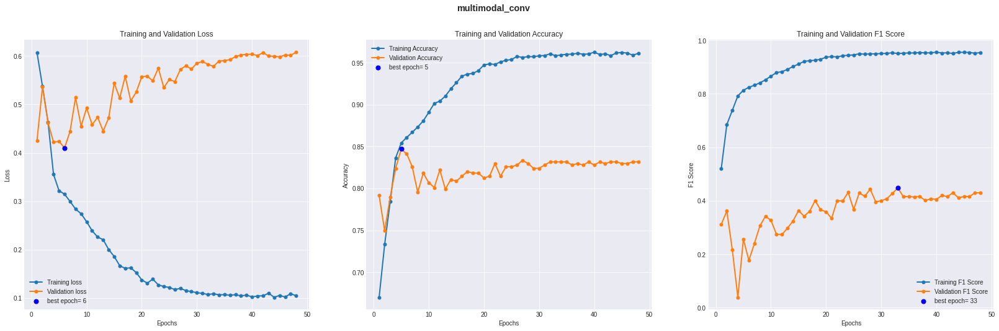

In [ ]:
#TP aug
#performance with standard augmentation tuned out to be even worse
my_model_name='multimodal_conv'
(my_callbacks, exp_dir) = create_folders_and_callbacks(model_name=my_model_name)
historymulti = multimodel_c.fit( x=training_generator3mod,   
          validation_data = ([valens_images_AR1mod,valens_images_AR2,valens_images_AR3mod],valens_labels), 
          epochs = epochs, steps_per_epoch = steps,
          callbacks=my_callbacks
          )

#Plot
resume_plot(historymulti, exp_dir, my_model_name)
#Animation
animated_plot(historymulti, repeat_animation=False)

In [ ]:
#all aug
#but with the increased dataset this network improved considerably outperforming the above and proving the previous hypotheses to be true
my_model_name='multimodal_convALL'
(my_callbacks, exp_dir) = create_folders_and_callbacks(model_name=my_model_name)
historymulti = multimodel_c.fit( x=training_generator3mod,   
          validation_data = ([valens_images_AR1mod,valens_images_AR2,valens_images_AR3mod],valens_labels), 
          epochs = epochs, steps_per_epoch = steps,
          callbacks=my_callbacks
          )

#Plot
resume_plot(historymulti, exp_dir, my_model_name)
#Animation
animated_plot(historymulti, repeat_animation=False)

(16884, 2)
 array([[6883,    0],
       [1671,    1],
       [2625,  180],
       ...,
       [6381,  270],
       [6173,  270],
       [4480,    1]])
Epoch 1/50
168/168 [==============================] - 324s 2s/step - loss: 0.6049 - acc: 0.6652 - recall: 0.6591 - precision: 0.6554 - f1score: 0.6297 - val_loss: 0.6057 - val_acc: 0.6826 - val_recall: 0.7742 - val_precision: 0.3410 - val_f1score: 0.4479 - lr: 1.2500e-04
Epoch 2/50
168/168 [==============================] - 311s 2s/step - loss: 0.4988 - acc: 0.7634 - recall: 0.8060 - precision: 0.7411 - f1score: 0.7657 - val_loss: 0.3741 - val_acc: 0.8528 - val_recall: 0.7326 - val_precision: 0.5302 - val_f1score: 0.5747 - lr: 1.2500e-04
Epoch 3/50
168/168 [==============================] - 309s 2s/step - loss: 0.3934 - acc: 0.8335 - recall: 0.8246 - precision: 0.8403 - f1score: 0.8268 - val_loss: 0.3244 - val_acc: 0.9120 - val_recall: 0.8751 - val_precision: 0.6811 - val_f1score: 0.7383 - lr: 1.2500e-04
Epoch 4/50
168/168 [=============

In [ ]:
multimodel_c.load_weights("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/multimodal_convALL_Dec08_10-25-50/ckpts/cp.ckpt")

In [ ]:
#all aug (continue from above, not really, ckpts were lost for some reason)
my_model_name='multimodal_convALL'
(my_callbacks, exp_dir) = create_folders_and_callbacks(model_name=my_model_name)
historymulti = multimodel_c.fit( x=training_generator3mod,   
          validation_data = ([valens_images_AR1mod,valens_images_AR2,valens_images_AR3mod],valens_labels), 
          epochs = epochs, steps_per_epoch = steps,
          callbacks=my_callbacks
          )

#Plot
resume_plot(historymulti, exp_dir, my_model_name)
#Animation
animated_plot(historymulti, repeat_animation=False)

Epoch 1/50
168/168 [==============================] - 334s 2s/step - loss: 0.2630 - acc: 0.8978 - recall: 0.8812 - precision: 0.9075 - f1score: 0.8916 - val_loss: 0.3359 - val_acc: 0.9254 - val_recall: 0.9294 - val_precision: 0.6887 - val_f1score: 0.7659 - lr: 1.2500e-04
Epoch 2/50
168/168 [==============================] - 326s 2s/step - loss: 0.2268 - acc: 0.9165 - recall: 0.9076 - precision: 0.9213 - f1score: 0.9123 - val_loss: 0.3696 - val_acc: 0.9293 - val_recall: 0.9294 - val_precision: 0.6951 - val_f1score: 0.7666 - lr: 1.2500e-04
Epoch 3/50
168/168 [==============================] - 318s 2s/step - loss: 0.2013 - acc: 0.9286 - recall: 0.9258 - precision: 0.9283 - f1score: 0.9254 - val_loss: 0.3373 - val_acc: 0.9369 - val_recall: 0.9294 - val_precision: 0.7149 - val_f1score: 0.7867 - lr: 1.2500e-04
Epoch 4/50
168/168 [==============================] - 323s 2s/step - loss: 0.1831 - acc: 0.9343 - recall: 0.9318 - precision: 0.9345 - f1score: 0.9317 - val_loss: 0.2980 - val_acc: 0.9

In [ ]:
multimodel_c.load_weights("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/multimodal_convALL_Dec08_12-37-19/ckpts/cp.ckpt")

(16884, 2)
 array([[ 256,   30],
       [ 257,    2],
       [ 259,    2],
       ...,
       [7126,  330],
       [7129,   30],
       [7148,  210]])
Epoch 1/50
168/168 [==============================] - 351s 2s/step - loss: 0.1677 - acc: 0.9431 - recall: 0.9406 - precision: 0.9422 - f1score: 0.9405 - val_loss: 0.2667 - val_acc: 0.9560 - val_recall: 0.9412 - val_precision: 0.7608 - val_f1score: 0.8276 - lr: 1.2500e-04
Epoch 2/50
168/168 [==============================] - 317s 2s/step - loss: 0.1548 - acc: 0.9467 - recall: 0.9462 - precision: 0.9451 - f1score: 0.9446 - val_loss: 0.3255 - val_acc: 0.9331 - val_recall: 0.9412 - val_precision: 0.6958 - val_f1score: 0.7791 - lr: 1.2500e-04
Epoch 3/50
168/168 [==============================] - 317s 2s/step - loss: 0.1401 - acc: 0.9535 - recall: 0.9560 - precision: 0.9494 - f1score: 0.9521 - val_loss: 0.3045 - val_acc: 0.9503 - val_recall: 0.9412 - val_precision: 0.7494 - val_f1score: 0.8191 - lr: 1.2500e-04
Epoch 4/50
168/168 [=============

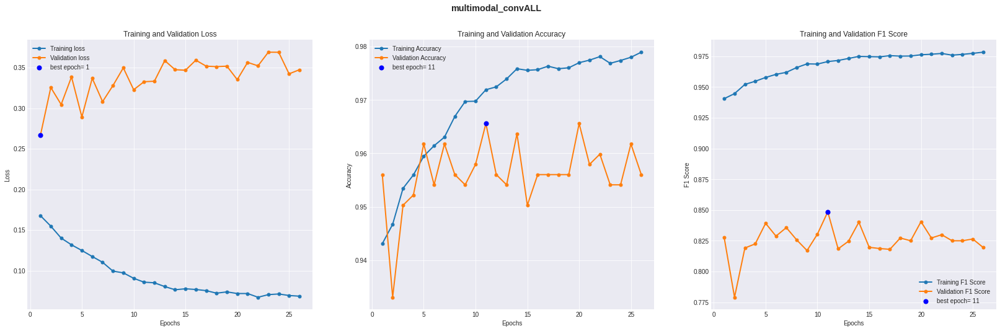

In [ ]:
#all aug (continue from above, which is already a continuation)
my_model_name='multimodal_convALL'
(my_callbacks, exp_dir) = create_folders_and_callbacks(model_name=my_model_name)
historymulti = multimodel_c.fit( x=training_generator3mod,   
          validation_data = ([valens_images_AR1mod,valens_images_AR2,valens_images_AR3mod],valens_labels), 
          epochs = epochs, steps_per_epoch = steps,
          callbacks=my_callbacks
          )

#Plot
resume_plot(historymulti, exp_dir, my_model_name)
#Animation
animated_plot(historymulti, repeat_animation=False)

In [ ]:
multimodel_c.save(os.path.join(exps_dir, str('best_model/' +  my_model_name)))
#model_archi3_article.save('./archi3_bal__article.h5')
#model_archi3_article.save('./Task1/archi3_bal_article_sure.h5')
#model_archi3_article.save_weights('./Task1/archi3_bal_article_weights.h5')
#model_archi3_article.save_weights('./archi3_bal_article_weights_bu.h5')
#model_archi3_article.save('./Task1/archi3_bal_article_gaus.h5')
#model_archi3_article.save_weights('./archi3_bal_article_weights_gaus.h5')

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/multimodal_convALL/assets


In [ ]:
multimodel_c=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/multimodal_conv", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)
multimodel_cALL=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/multimodal_convALL", custom_objects={"f1score":f1score,"recall":recall,"precision":precision,"loss":custom_crossentropy}, compile=True, options=None)

### **Prediction on valens dataset**

In [ ]:
y_pred_valens_multi_c = multimodel_c.predict([valens_images_AR1mod,valens_images_AR2,valens_images_AR3mod])
y_pred_valens_multi_c = np.asarray(y_pred_valens_multi_c)[:,0]

In [ ]:
y_pred_valens_multi_cALL = multimodel_cALL.predict([valens_images_AR1mod,valens_images_AR2,valens_images_AR3mod])
y_pred_valens_multi_cALL = np.asarray(y_pred_valens_multi_cALL)[:,0]

## Evaluate on TP aug train set

## Confusion Matrix

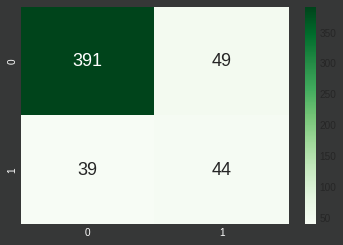

In [ ]:
#--Multimodal model--
selected_thr = 0.5
# Confusion Matrix
CMmulti = confusion_matrix(y_valens,y_pred_valens_multi_c>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMmulti, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

## **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--multimodal model--
tn, fp, fn, tp = CMmulti.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_multi_c>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens_multi_c>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

391
49
39
44
Acc: 0.8317399617590823
f1 score: 0.5000000000000001
(Se,Pr)=(0.53,0.47)


## **Curves PRC and ROC**

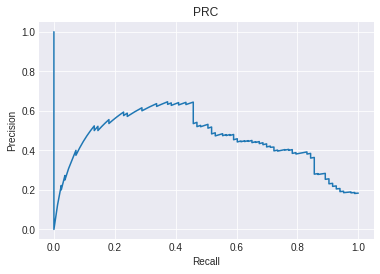

AUPRC TEST-SET : 0.4483


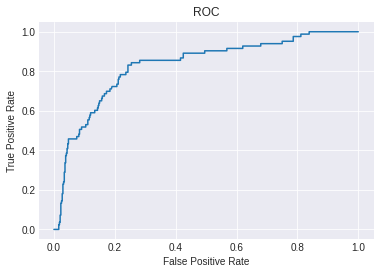

AUROC: 0.8288


In [ ]:
#--multimodal model--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_multi_c)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_multi_c)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

## Evaluate on all aug train set

## Confusion Matrix

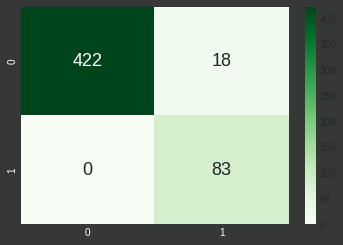

In [ ]:
#--Multimodal model--
selected_thr = 0.5
# Confusion Matrix
CMmulti = confusion_matrix(y_valens,y_pred_valens_multi_cALL>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMmulti, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

## **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--multimodal model--
tn, fp, fn, tp = CMmulti.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_multi_cALL>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens_multi_cALL>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

422
18
0
83
Acc: 0.9655831739961759
f1 score: 0.9021739130434783
(Se,Pr)=(1.0,0.82)


## **Curves PRC and ROC**

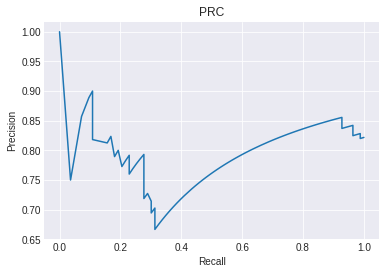

AUPRC TEST-SET : 0.7961


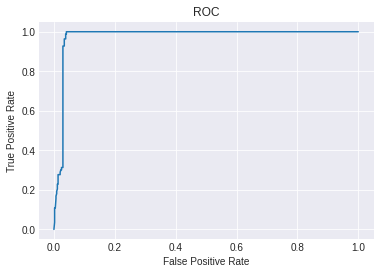

AUROC: 0.9766


In [ ]:
#--multimodal model--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_multi_cALL)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_multi_cALL)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

# **Ensemble models: combine outputs of multiple models**
Notice: obviously the ensemble models are not validated on the same validation set as the single models were validated upon since they have been optimized for that data so the ensemble performance on it would not be indicative of the actual ensemble's contribution to generalization on new data; this said val_ens is not a test set since it is used to select the best ensemble so we are also optimizing with respect to this data at this point.

In [ ]:
#architectures as in article trained on balanced dataset by only augmenting TP samples
y_pred_val1 = model_archi1_article.predict(val_images_AR1)
y_pred_val1 = np.asarray(y_pred_val1)[:,0]
y_pred_val2 = model_archi2_article.predict(val_images_AR2)
y_pred_val2 = np.asarray(y_pred_val2)[:,0]
y_pred_val3 = model_archi3_article.predict(val_images_AR3)
y_pred_val3 = np.asarray(y_pred_val3)[:,0]

In [ ]:
#architectures as in article trained on balanced dataset by augmenting all of it (18-2)
y_pred_val1all = model_archi1_all.predict(val_images_AR1)
y_pred_val1all = np.asarray(y_pred_val1all)[:,0]
y_pred_val2all = model_archi2_all.predict(val_images_AR2)
y_pred_val2all = np.asarray(y_pred_val2all)[:,0]
y_pred_val3all = model_archi3_all.predict(val_images_AR3)
y_pred_val3all = np.asarray(y_pred_val3all)[:,0]

## Combine archis on just_TP aug

In [ ]:
#CREATE A MATRIX WITH THE PREDICTED PROBABILITIES TO BE COMBINED #evaluate model on valens set
FTmatrix_train  = np.concatenate((y_pred_valens1.reshape(-1,1),y_pred_valens2.reshape(-1,1),y_pred_valens3.reshape(-1,1)),axis=1) #valens set used for validation
FTmatrix_train.shape

(523, 3)

In [ ]:
#define the grid of weights to be investigated
values_grid = np.arange(0.01, 0.99, 0.01);

def prediction (matrix, a, b, c):
  lista =[]
  for i in range (matrix.shape[0]):
    h = a*matrix[i][0] + b*matrix[i][1] + c*matrix[i][2] #try different thr for predicting pos for each archi (optimize)
    lista.append(h)
  return lista

### Gridsearch of best weights for each architecture

In [ ]:
# FOR LOOP TO SEARCH THE BEST COMBINATION OF WEIGHTS 
FTmatrix_val= np.concatenate((y_pred_val1.reshape(-1,1),y_pred_val2.reshape(-1,1),y_pred_val3.reshape(-1,1)),axis=1) #use validation set for training
best = [0, 0, 0]
area_max = 0
for a in values_grid:
  for b in values_grid:
    for c in values_grid:
      if(a+b+c == 1):
        y_pred = prediction(FTmatrix_val, a, b, c);
        y_pred = np.asarray(y_pred)
        prec, rec, thr_auprc=precision_recall_curve(y_val,y_pred)
        fpr, tpr, thr_auc=roc_curve(y_val,y_pred)
        auprc = auc(rec,prec)
        auroc = auc(fpr,tpr)
        if(auprc > area_max): #try also with auroc
          area_max = auprc
          best[0] = a
          best[1] = b
          best[2] = c

print(best)

[0.45, 0.25, 0.3]


In [ ]:
# derive the  weighted predicted probabilities
#evaluate performances on valens set
y_pred_multibranch_valens = prediction(FTmatrix_train, best[0], best[1], best[2])
y_pred_multibranch_valens = np.asarray(y_pred_multibranch_valens)[:]

#### Confusion Matrix

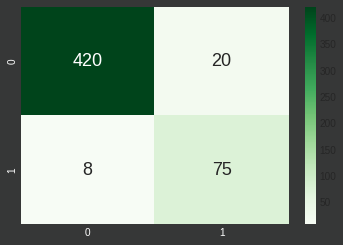

In [ ]:
#--ensamble model weighted gridsearch--
selected_thr = 0.5
# Confusion Matrix
CMfens = confusion_matrix(y_valens,y_pred_multibranch_valens>=selected_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMfens, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model weighted gridsearch--
tn, fp, fn, tp = CMfens.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_multibranch_valens>=selected_thr)
f1 = f1_score(y_valens,y_pred_multibranch_valens>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

420
20
8
75
Acc: 0.9464627151051626
f1 score: 0.8426966292134832
(Se,Pr)=(0.9,0.79)


#### Curves PRC and ROC

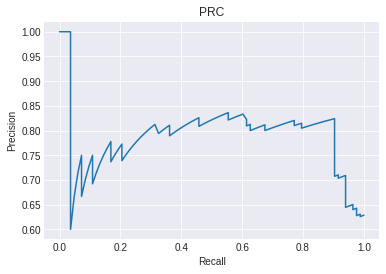

AUPRC TEST-SET : 0.7876


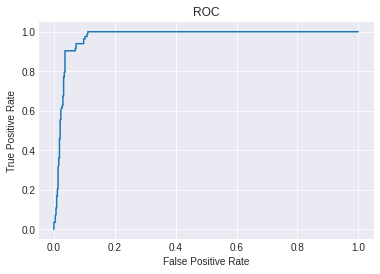

AUROC: 0.9729


In [ ]:
#--ensamble model weighted gridsearch--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_multibranch_valens)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_multibranch_valens)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### Combine optimizing prediction threshold 

In [ ]:
 f1_max = 0
for thr in values_grid:
    y_pred = prediction(FTmatrix_val, 1./3, 1./3, 1./3)
    y_pred = np.asarray(y_pred)
    f1val = f1_score(y_val,y_pred>=thr)
    if(f1val > f1_max):
        f1_max = f1val
        best_thr=thr

print(best_thr)

0.43


In [ ]:
y_pred_valens_t = prediction(FTmatrix_train, 1./3, 1./3, 1./3)
y_pred_valens_t = np.asarray(y_pred_valens_t)[:]

#### Confusion Matrix

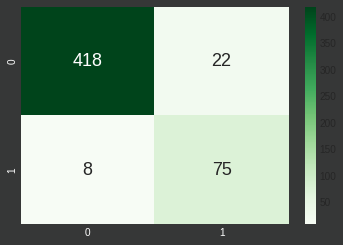

In [ ]:
# Confusion Matrix --best pred thr--
CMft = confusion_matrix(y_valens,y_pred_valens_t>=best_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMft, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model, best pred thr--
tn, fp, fn, tp = CMft.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_t>=best_thr)
f1 = f1_score(y_valens,y_pred_valens_t>=best_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

418
22
8
75
Acc: 0.9426386233269598
f1 score: 0.8333333333333334
(Se,Pr)=(0.9,0.77)


#### Curves PRC and ROC

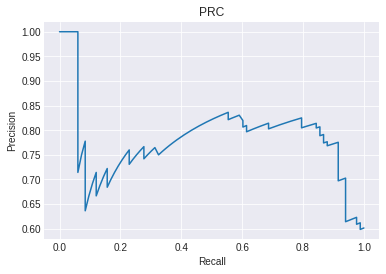

AUPRC TEST-SET : 0.7812


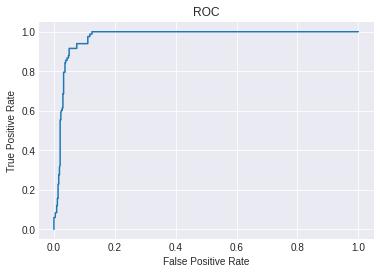

AUROC: 0.9709


In [ ]:
#--ensamble model, best pred thr--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_t)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_t)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

#### Ensamble combining the 3 archis' outputs weighted by own f1 on val

In [ ]:
selected_thr=0.5
f1val1 = f1_score(y_val,y_pred_val1>=selected_thr)
f1val2 = f1_score(y_val,y_pred_val2>=selected_thr)
f1val3 = f1_score(y_val,y_pred_val3>=selected_thr)
f1val1,f1val2,f1val3

(0.8, 0.3341645885286783, 0.7628865979381444)

In [ ]:
#on validation set for ensamble methods
summ=f1val1+f1val2+f1val3
w1=f1val1/summ
w2=f1val2/summ
w3=f1val3/summ
y_pred_fens = prediction(FTmatrix_train, w1, w2, w3)
y_pred_fens = np.asarray(y_pred_fens)[:]

In [ ]:
y_valens.shape, y_pred_fens.shape, FTmatrix_train.shape

((523,), (523,), (523, 3))

### Confusion Matrix

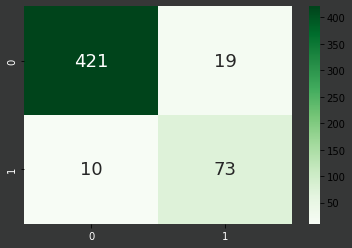

In [ ]:
#--ensamble model weighted on f1score--
selected_thr = 0.5
# Confusion Matrix
CMfens = confusion_matrix(y_valens,y_pred_fens>=selected_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMfens, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model weighted on f1score--
tn, fp, fn, tp = CMfens.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_fens>=selected_thr)
f1 = f1_score(y_valens,y_pred_fens>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

421
19
10
73
Acc: 0.9445506692160612
f1 score: 0.8342857142857142
(Se,Pr)=(0.88,0.79)


#### Curves PRC and ROC

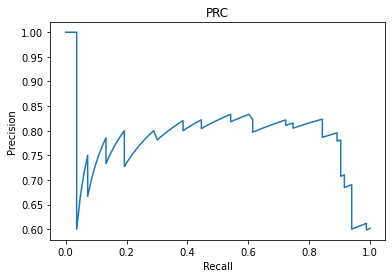

AUPRC TEST-SET : 0.7853


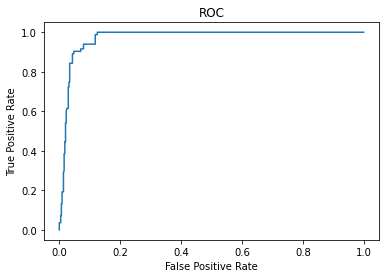

AUROC: 0.9714


In [ ]:
#--ensamble model weighted on f1score--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_fens)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_fens)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### decision tree and logistic regression

In [ ]:
#models chosen for interpretability
#they are fed the output of the single models and gridsearch is used to optimize their main hyperparameters

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
X_train= FTmatrix_val
Y_train= y_val
X_test= FTmatrix_train
Y_test= y_valens

def hyperp_search(classifier, parameters):
    gs = GridSearchCV(classifier, parameters, cv=2, scoring = 'f1', verbose=3)
    gs = gs.fit(X_train, Y_train)
    f1_train = gs.best_score_
    print("f1_train: %f using %s" % (f1_train, gs.best_params_))

    best_model = gs.best_estimator_
    y_tr_pred= best_model.predict(X_train)
    y_pred = best_model.predict(X_test)
    f1_test = f1_score(Y_test, y_pred)
    print("f1_test: ", f1_test)
    
    print(confusion_matrix(Y_test, y_pred))

    print("acc_train: ", accuracy_score(Y_train, y_tr_pred))
    print("acc_test: ", accuracy_score(Y_test, y_pred))
    print("precision_train: ", precision_score(Y_train, y_tr_pred))
    print("precision_test: ", precision_score(Y_test, y_pred))
    print("recall_train: ", recall_score(Y_train, y_tr_pred))
    print("recall_test: ", recall_score(Y_test, y_pred))
    
    return (best_model)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier()
parameters = {'criterion': ['entropy'],'max_depth': [1,2,3,4],'min_samples_split': [3,5],'min_samples_leaf': [3,5]}

best_tree = hyperp_search(classifier,parameters)

Fitting 2 folds for each of 16 candidates, totalling 32 fits
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=3;, score=0.857 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=3;, score=0.675 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=5;, score=0.857 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=5;, score=0.675 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=3;, score=0.857 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=3;, score=0.675 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=5;, score=0.857 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=5;, score=0.675 total time=   

In [ ]:
from sklearn import tree
r = tree.export_text(best_tree)
print(r) 

|--- feature_0 <= 0.18
|   |--- feature_2 <= 0.03
|   |   |--- class: 0
|   |--- feature_2 >  0.03
|   |   |--- feature_2 <= 0.76
|   |   |   |--- feature_1 <= 0.58
|   |   |   |   |--- class: 0
|   |   |   |--- feature_1 >  0.58
|   |   |   |   |--- class: 0
|   |   |--- feature_2 >  0.76
|   |   |   |--- feature_1 <= 0.39
|   |   |   |   |--- class: 1
|   |   |   |--- feature_1 >  0.39
|   |   |   |   |--- class: 0
|--- feature_0 >  0.18
|   |--- feature_0 <= 0.78
|   |   |--- feature_2 <= 0.14
|   |   |   |--- feature_1 <= 0.56
|   |   |   |   |--- class: 0
|   |   |   |--- feature_1 >  0.56
|   |   |   |   |--- class: 0
|   |   |--- feature_2 >  0.14
|   |   |   |--- feature_1 <= 0.32
|   |   |   |   |--- class: 0
|   |   |   |--- feature_1 >  0.32
|   |   |   |   |--- class: 1
|   |--- feature_0 >  0.78
|   |   |--- feature_1 <= 0.62
|   |   |   |--- feature_1 <= 0.43
|   |   |   |   |--- class: 1
|   |   |   |--- feature_1 >  0.43
|   |   |   |   |--- class: 1
|   |   |--- featur

In [ ]:
#install graphviz https://graphviz.gitlab.io/download/

import sys
!conda install --yes --prefix {sys.prefix} graphviz
!{sys.executable} -m pip install graphviz

/bin/bash: conda: command not found


In [ ]:
from sklearn.tree import export_graphviz
export_graphviz(best_tree, out_file='decision_tree.dot', feature_names = ["Archi1","Archi2","Archi3"])

In [ ]:
!dot -Tpng decision_tree.dot -o decision_tree.png -Gdpi=600

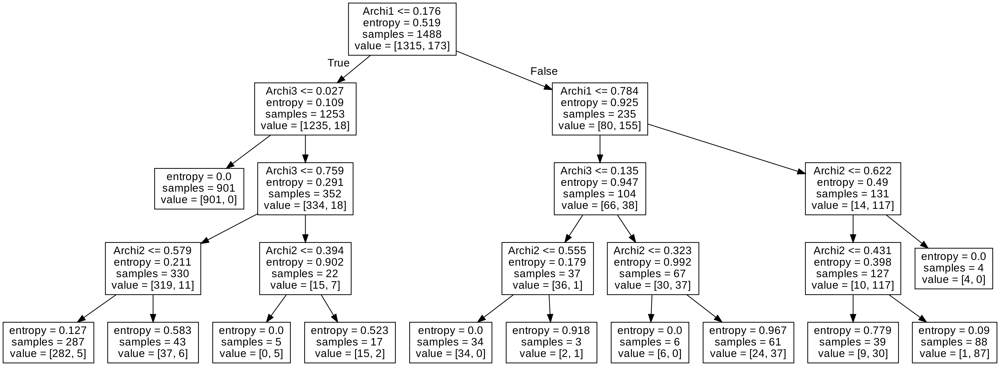

In [ ]:
from IPython.display import Image
Image(filename = 'decision_tree.png')

In [ ]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()
parameters = {"C":[1e-3,1e-2,1e-1,1,10], "max_iter":[1000,2000], "tol": [1e-4,1e-5]} #C regulates the trade off between generalization (given by the regularization term) and the loss function (minimising the error) so a higher C may cause overfitting

best_logisticReg = hyperp_search(classifier,parameters)

Fitting 2 folds for each of 20 candidates, totalling 40 fits
[CV 1/2] END C=0.001, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END C=0.001, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.001, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.001, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2] END C=0.001, max_iter=2000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END C=0.001, max_iter=2000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.001, max_iter=2000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.001, max_iter=2000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.01, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.01, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END ..C=0.01, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END ..C=0.01, max_iter=1000, tol=1e-05;

In [ ]:
best_logisticReg.coef_

array([[4.02187287, 4.47321638, 2.76086345]])

### Check differences in what each archi learns

In [ ]:
def pred(y):
    if y>0.5:
        return 1
    else:    
        return 0

In [ ]:
tot_missclass1=0
tot_missclass2=0
tot_missclass3=0
tot_missclass1as2=0
tot_missclass1as3=0
tot_missclass2as3=0
tot_missclass1as2as3=0
tot_missclassU=0

for i in range(len(y_valens)):
    if (pred(y_pred_valens1[i]) != pred(y_valens[i]) and (pred(y_pred_valens2[i]) == pred(y_valens[i])) and (pred(y_pred_valens3[i]) == pred(y_valens[i]))):
        tot_missclass1+=1
    if (pred(y_pred_valens2[i]) != pred(y_valens[i]) and (pred(y_pred_valens1[i]) == pred(y_valens[i])) and (pred(y_pred_valens3[i]) == pred(y_valens[i]))):
        tot_missclass2+=1
    if (pred(y_pred_valens3[i]) != pred(y_valens[i]) and (pred(y_pred_valens1[i]) == pred(y_valens[i])) and (pred(y_pred_valens2[i]) == pred(y_valens[i]))):
        tot_missclass3+=1
    if ((pred(y_pred_valens1[i]) != pred(y_valens[i])) and (pred(y_pred_valens2[i]) != pred(y_valens[i])) and (pred(y_pred_valens3[i]) == pred(y_valens[i]))):
        tot_missclass1as2+=1
    if ((pred(y_pred_valens1[i]) != pred(y_valens[i])) and (pred(y_pred_valens3[i]) != pred(y_valens[i])) and (pred(y_pred_valens2[i]) == pred(y_valens[i]))):
        tot_missclass1as3+=1
    if ((pred(y_pred_valens2[i]) != pred(y_valens[i])) and (pred(y_pred_valens3[i]) != pred(y_valens[i])) and (pred(y_pred_valens1[i]) == pred(y_valens[i]))):
        tot_missclass2as3+=1
    if ((pred(y_pred_valens1[i]) != pred(y_valens[i])) and (pred(y_pred_valens2[i]) != pred(y_valens[i])) and (pred(y_pred_valens3[i]) != pred(y_valens[i]))):
        tot_missclass1as2as3+=1
    if ((pred(y_pred_valens1[i]) != pred(y_valens[i])) ^ (pred(y_pred_valens2[i]) != pred(y_valens[i])) ^ (pred(y_pred_valens3[i]) != pred(y_valens[i]))):
        tot_missclassU+=1

print("Considering the valens set: \n")
print(f"Out of {tot_missclass1} missclassifications for only ARCHI1, {tot_missclass1as2} are in common with ARCHI2, which missclassifies (alone) {tot_missclass2} samples")
print(f"and {tot_missclass1as3} are in common with ARCHI3, which missclassifies (alone) {tot_missclass3} samples")  
print(f"The number of common missclassifications for ARCHI2 and ARCHI 3 is {tot_missclass2as3}")
print(f"The number of common missclassifications for all 3 achitectures is {tot_missclass1as2as3}, compared to the {tot_missclassU} samples which are missclassified only by 1 architecture")

Considering the valens set: 

Out of 13 missclassifications for only ARCHI1, 5 are in common with ARCHI2, which missclassifies (alone) 84 samples
and 7 are in common with ARCHI3, which missclassifies (alone) 10 samples
The number of common missclassifications for ARCHI2 and ARCHI 3 is 9
The number of common missclassifications for all 3 achitectures is 13, compared to the 120 samples which are missclassified only by 1 architecture


## Combine archis on all aug 18-2

In [ ]:
#CREATE A MATRIX WITH THE PREDICTED PROBABILITIES TO BE COMBINED #evaluate model of valens set
FTmatrix_trainALL  = np.concatenate((y_pred_valens1all.reshape(-1,1),y_pred_valens2all.reshape(-1,1),y_pred_valens3all.reshape(-1,1)),axis=1) #valens set used for validation
FTmatrix_trainALL.shape

(523, 3)

In [ ]:
#define the grid of weights to be investigated
values_grid = np.arange(0.01, 0.99, 0.01);

def prediction (matrix, a, b, c):
  lista =[]
  for i in range (matrix.shape[0]):
    h = a*matrix[i][0] + b*matrix[i][1] + c*matrix[i][2] #try different thr for predicting pos for each archi (optimize)
    lista.append(h)
  return lista

### Gridsearch of best weights for each architecture

In [ ]:
# FOR LOOP TO SEARCH THE BEST COMBINATION OF WEIGHTS 
FTmatrix_valALL= np.concatenate((y_pred_val1all.reshape(-1,1),y_pred_val2all.reshape(-1,1),y_pred_val3all.reshape(-1,1)),axis=1) #use validation set for training
best = [0, 0, 0]
area_max = 0
for a in values_grid:
  for b in values_grid:
    for c in values_grid:
      if(a+b+c == 1):
        y_pred = prediction(FTmatrix_valALL, a, b, c);
        y_pred = np.asarray(y_pred)
        prec, rec, thr_auprc=precision_recall_curve(y_val,y_pred)
        fpr, tpr, thr_auc=roc_curve(y_val,y_pred)
        auprc = auc(rec,prec)
        auroc = auc(fpr,tpr)
        if(auprc > area_max): #try also with auroc
          area_max = auprc
          best[0] = a
          best[1] = b
          best[2] = c

print(best)

[0.05, 0.72, 0.23]


In [ ]:
# derive the  weighted predicted probabilities
#evaluate performances on valens set
y_pred_multibranch_valensALL = prediction(FTmatrix_trainALL, best[0], best[1], best[2])
y_pred_multibranch_valensALL = np.asarray(y_pred_multibranch_valensALL)[:]

#### Confusion Matrix

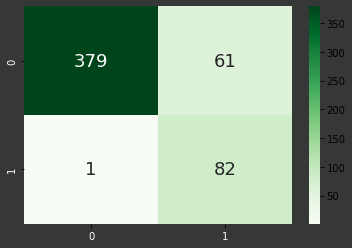

In [ ]:
#--ensamble model weighted gridsearch--
selected_thr = 0.5
# Confusion Matrix
CMfens = confusion_matrix(y_valens,y_pred_multibranch_valensALL>=selected_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMfens, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model weighted gridsearch--
tn, fp, fn, tp = CMfens.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_multibranch_valensALL>=selected_thr)
f1 = f1_score(y_valens,y_pred_multibranch_valensALL>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

379
61
1
82
Acc: 0.8814531548757171
f1 score: 0.7256637168141593
(Se,Pr)=(0.99,0.57)


#### Curves PRC and ROC

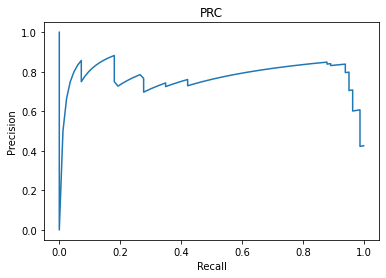

AUPRC TEST-SET : 0.7719


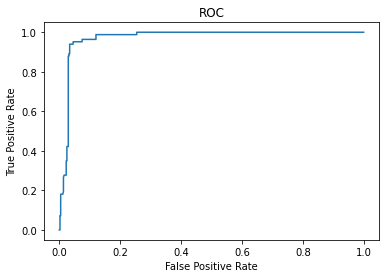

AUROC: 0.9716


In [ ]:
#--ensamble model weighted gridsearch--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_multibranch_valensALL)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_multibranch_valensALL)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### Combine optimizing prediction threshold 

In [ ]:
 f1_max = 0
for thr in values_grid:
    y_pred = prediction(FTmatrix_valALL, 1./3, 1./3, 1./3)
    y_pred = np.asarray(y_pred)
    f1val = f1_score(y_val,y_pred>=thr)
    if(f1val > f1_max):
        f1_max = f1val
        best_thr=thr

print(best_thr)

0.66


In [ ]:
y_pred_valens_tALL = prediction(FTmatrix_trainALL, 1./3, 1./3, 1./3)
y_pred_valens_tALL = np.asarray(y_pred_valens_tALL)[:]

### Confusion Matrix

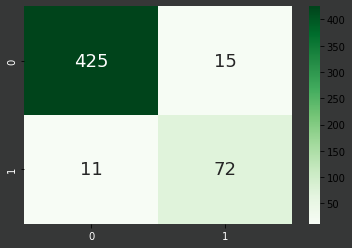

In [ ]:
# Confusion Matrix --best pred thr--
CMft = confusion_matrix(y_valens,y_pred_valens_tALL>=best_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMft, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model, best pred thr--
tn, fp, fn, tp = CMft.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_tALL>=best_thr)
f1 = f1_score(y_valens,y_pred_valens_tALL>=best_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

425
15
11
72
Acc: 0.9502868068833652
f1 score: 0.8470588235294118
(Se,Pr)=(0.87,0.83)


#### Curves PRC and ROC

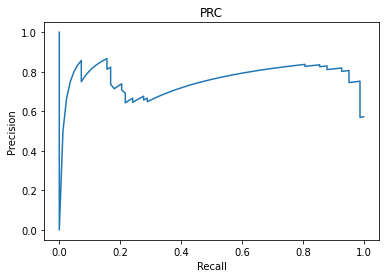

AUPRC TEST-SET : 0.7592


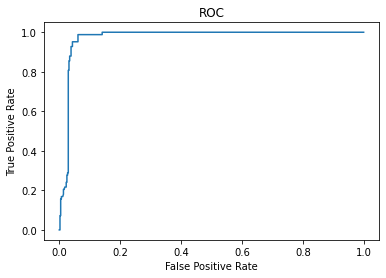

AUROC: 0.9724


In [ ]:
#--ensamble model, best pred thr--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_tALL)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_tALL)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### Ensamble combining the 3 archis' outputs weighted by own f1 on val

In [ ]:
selected_thr=0.5
f1val1 = f1_score(y_val,y_pred_val1all>=selected_thr)
f1val2 = f1_score(y_val,y_pred_val2all>=selected_thr)
f1val3 = f1_score(y_val,y_pred_val3all>=selected_thr)
f1val1,f1val2,f1val3

(0.8053333333333332, 0.7544642857142856, 0.6623376623376623)

In [ ]:
#on validation set for ensamble methods
summ=f1val1+f1val2+f1val3
w1=f1val1/summ
w2=f1val2/summ
w3=f1val3/summ
y_pred_fensALL = prediction(FTmatrix_trainALL, w1, w2, w3)
y_pred_fensALL = np.asarray(y_pred_fensALL)[:]

#### Confusion Matrix

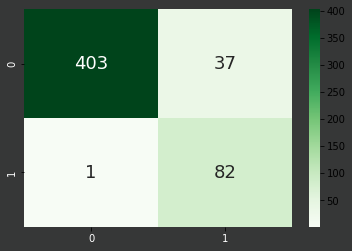

In [ ]:
#--ensamble model weighted on f1score--
selected_thr = 0.5
# Confusion Matrix
CMfens = confusion_matrix(y_valens,y_pred_fensALL>=selected_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMfens, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model weighted on f1score--
tn, fp, fn, tp = CMfens.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_fensALL>=selected_thr)
f1 = f1_score(y_valens,y_pred_fensALL>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

403
37
1
82
Acc: 0.9273422562141491
f1 score: 0.8118811881188117
(Se,Pr)=(0.99,0.69)


#### Curves PRC and ROC

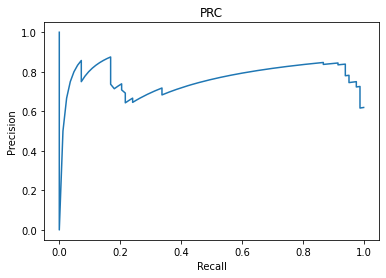

AUPRC TEST-SET : 0.7642


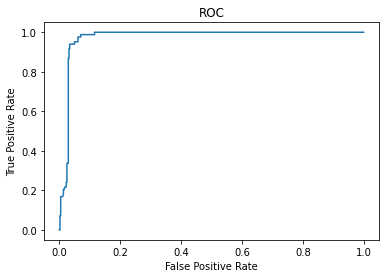

AUROC: 0.9734


In [ ]:
#--ensamble model weighted on f1score--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_fensALL)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_fensALL)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### decision tree and logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
X_train= FTmatrix_valALL
Y_train= y_val
X_test= FTmatrix_trainALL
Y_test= y_valens

def hyperp_search(classifier, parameters):
    gs = GridSearchCV(classifier, parameters, cv=2, scoring = 'f1', verbose=3)
    gs = gs.fit(X_train, Y_train)
    f1_train = gs.best_score_
    print("f1_train: %f using %s" % (f1_train, gs.best_params_))

    best_model = gs.best_estimator_
    y_tr_pred= best_model.predict(X_train)
    y_pred = best_model.predict(X_test)
    f1_test = f1_score(Y_test, y_pred)
    print("f1_test: ", f1_test)
    
    print(confusion_matrix(Y_test, y_pred))

    print("acc_train: ", accuracy_score(Y_train, y_tr_pred))
    print("acc_test: ", accuracy_score(Y_test, y_pred))
    print("precision_train: ", precision_score(Y_train, y_tr_pred))
    print("precision_test: ", precision_score(Y_test, y_pred))
    print("recall_train: ", recall_score(Y_train, y_tr_pred))
    print("recall_test: ", recall_score(Y_test, y_pred))
    
    return (best_model)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier()
parameters = {'criterion': ['entropy'],'max_depth': [1,2,3,4],'min_samples_split': [3,5],'min_samples_leaf': [3,5]}

best_tree = hyperp_search(classifier,parameters)

Fitting 2 folds for each of 16 candidates, totalling 32 fits
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=3;, score=0.966 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=3;, score=0.781 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=5;, score=0.966 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=5;, score=0.711 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=3;, score=0.966 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=3;, score=0.781 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=5;, score=0.966 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=5;, score=0.781 total time=   

In [ ]:
from sklearn import tree
r = tree.export_text(best_tree)
print(r) 

|--- feature_1 <= 0.64
|   |--- class: 0
|--- feature_1 >  0.64
|   |--- class: 1



In [ ]:
from sklearn.tree import export_graphviz
export_graphviz(best_tree, out_file='decision_tree.dot', feature_names = ["Archi1","Archi2","Archi3"])

In [ ]:
!dot -Tpng decision_tree.dot -o decision_tree.png -Gdpi=600

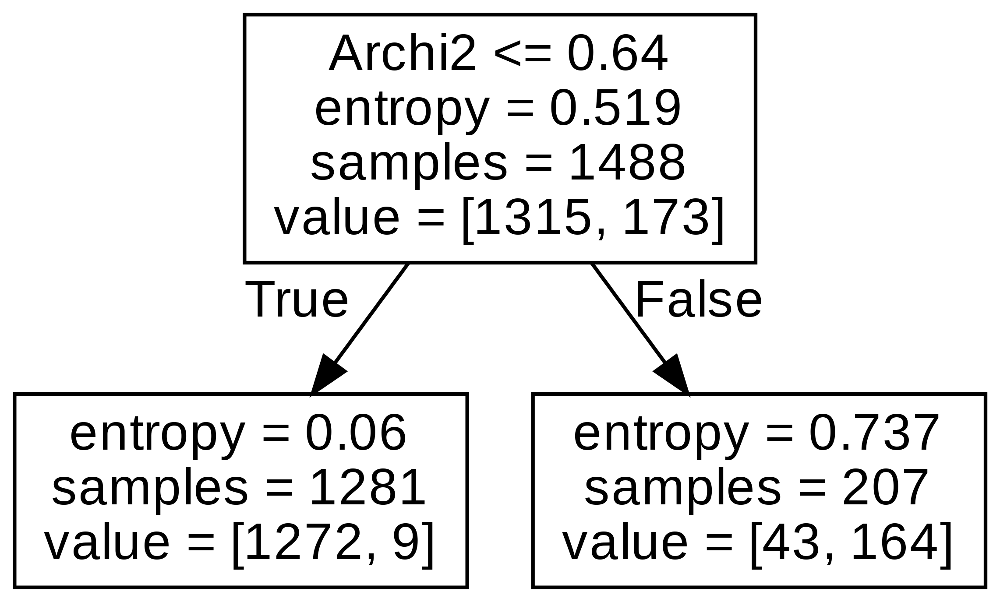

In [ ]:
from IPython.display import Image
Image(filename = 'decision_tree.png')

In [ ]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()
parameters = {"C":[1e-3,1e-2,1e-1,1,10], "max_iter":[1000,2000], "tol": [1e-4,1e-5]} #C regulates the trade off between generalization (given by the regularization term) and the loss function (minimising the error) so a higher C may cause overfitting

best_logisticReg = hyperp_search(classifier,parameters)

Fitting 2 folds for each of 20 candidates, totalling 40 fits
[CV 1/2] END C=0.001, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END C=0.001, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.001, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.001, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2] END C=0.001, max_iter=2000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END C=0.001, max_iter=2000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.001, max_iter=2000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.001, max_iter=2000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.01, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.01, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END ..C=0.01, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END ..C=0.01, max_iter=1000, tol=1e-05;

In [ ]:
best_logisticReg.coef_

array([[1.76426587, 5.47952755, 3.03867475]])

#### Check differences in what each archi learns

In [ ]:
def pred(y):
    if y>0.5:
        return 1
    else:    
        return 0

In [ ]:
tot_missclass1=0
tot_missclass2=0
tot_missclass3=0
tot_missclass1as2=0
tot_missclass1as3=0
tot_missclass2as3=0
tot_missclass1as2as3=0
tot_missclassU=0

for i in range(len(y_valens)):
    if (pred(y_pred_valens1all[i]) != pred(y_valens[i]) and (pred(y_pred_valens2all[i]) == pred(y_valens[i])) and (pred(y_pred_valens3all[i]) == pred(y_valens[i]))):
        tot_missclass1+=1
    if (pred(y_pred_valens2all[i]) != pred(y_valens[i])and (pred(y_pred_valens1all[i]) == pred(y_valens[i])) and (pred(y_pred_valens3all[i]) == pred(y_valens[i]))):
        tot_missclass2+=1
    if (pred(y_pred_valens3all[i]) != pred(y_valens[i]) and (pred(y_pred_valens1all[i]) == pred(y_valens[i])) and (pred(y_pred_valens2all[i]) == pred(y_valens[i]))):
        tot_missclass3+=1
    if ((pred(y_pred_valens1all[i]) != pred(y_valens[i])) and (pred(y_pred_valens2all[i]) != pred(y_valens[i])) and  (pred(y_pred_valens3all[i]) == pred(y_valens[i]))):
        tot_missclass1as2+=1
    if ((pred(y_pred_valens1all[i]) != pred(y_valens[i])) and (pred(y_pred_valens3all[i]) != pred(y_valens[i])) and  (pred(y_pred_valens2all[i]) == pred(y_valens[i]))):
        tot_missclass1as3+=1
    if ((pred(y_pred_valens2all[i]) != pred(y_valens[i])) and (pred(y_pred_valens3all[i]) != pred(y_valens[i])) and  (pred(y_pred_valens1all[i]) == pred(y_valens[i]))):
        tot_missclass2as3+=1
    if ((pred(y_pred_valens1all[i]) != pred(y_valens[i])) and (pred(y_pred_valens2all[i]) != pred(y_valens[i])) and (pred(y_pred_valens3all[i]) != pred(y_valens[i]))):
        tot_missclass1as2as3+=1
    if ((pred(y_pred_valens1all[i]) != pred(y_valens[i])) ^ (pred(y_pred_valens2all[i]) != pred(y_valens[i])) ^ (pred(y_pred_valens3all[i]) != pred(y_valens[i]))):
        tot_missclassU+=1

print("Considering the valens set: \n")
print(f"Out of {tot_missclass1} missclassifications for only ARCHI1, {tot_missclass1as2} are in common with ARCHI2, which missclassifies (alone) {tot_missclass2} samples")
print(f"and {tot_missclass1as3} are in common with ARCHI3, which missclassifies (alone) {tot_missclass3} samples")  
print(f"The number of common missclassifications for ARCHI2 and ARCHI 3 is {tot_missclass2as3}")
print(f"The number of common missclassifications for all 3 achitectures is {tot_missclass1as2as3}, compared to the {tot_missclassU} samples which are missclassified only by 1 architecture")

Considering the valens set: 

Out of 11 missclassifications for only ARCHI1, 19 are in common with ARCHI2, which missclassifies (alone) 27 samples
and 0 are in common with ARCHI3, which missclassifies (alone) 46 samples
The number of common missclassifications for ARCHI2 and ARCHI 3 is 16
The number of common missclassifications for all 3 achitectures is 18, compared to the 102 samples which are missclassified only by 1 architecture


## Combine archis on all aug x10 TP and x2 FP 
Having noticed during the 2 previous attempts that the ensembles' performances corresponded to the average performance of the single models the worst one of the 3 was dropped; and we can notice this increased the overall performance considerably

In [ ]:
model_archi1_article = build_archi1_gmp(archi1_input_shape)
model_archi2_article = build_archi2_gmp(archi2_input_shape)

#ar1: 0.85 f1 val
model_archi1_article.load_weights("/content/gdrive/MyDrive/neuroengineering/project/StudentsFolder/model_seba_neuro/EnsembleModels/Archi1_Albumentation_sbilanciato_Dec07_01-21-03/ckpts/cp.ckpt")
#ar2 : 0.89 f1 val
model_archi2_article.load_weights("/content/gdrive/MyDrive/neuroengineering/project/StudentsFolder/model_seba_neuro/EnsembleModels/Archi2_Albumentation_Bilanciato_TP9_FP1_Dec07_02-40-49/ckpts/cp.ckpt")
#ar 3: f1 val
model_archi3_article.load_weights("/content/gdrive/MyDrive/neuroengineering/project/StudentsFolder/Vittoria/Archi3_all9.1_Dec12_10-51-53-20211212T160925Z-001.zip (Unzipped Files)/Archi3_all9.1_Dec12_10-51-53/ckpts/cp.ckpt")

In [ ]:
y_pred_valens12 = model_archi1_article.predict(valens_images_AR1)
y_pred_valens12 = np.asarray(y_pred_valens12)[:,0]
y_pred_valens22 = model_archi2_article.predict(valens_images_AR2)
y_pred_valens22 = np.asarray(y_pred_valens22)[:,0]
y_pred_valens32 = model_archi3_article.predict(valens_images_AR3)
y_pred_valens32 = np.asarray(y_pred_valens32)[:,0]

In [ ]:
y_pred_val12 = model_archi1_article.predict(val_images_AR1)
y_pred_val12 = np.asarray(y_pred_val12)[:,0]
y_pred_val22 = model_archi2_article.predict(val_images_AR2)
y_pred_val22 = np.asarray(y_pred_val22)[:,0]
y_pred_val32 = model_archi3_article.predict(val_images_AR3)
y_pred_val32 = np.asarray(y_pred_val32)[:,0]

In [ ]:
#CREATE A MATRIX WITH THE PREDICTED PROBABILITIES TO BE COMBINED #evaluate model of valens set
FTmatrix_train2  = np.concatenate((y_pred_valens12.reshape(-1,1),y_pred_valens22.reshape(-1,1)),axis=1) #valens set used for validation
FTmatrix_train2.shape
FTmatrix_train3  = np.concatenate((y_pred_valens12.reshape(-1,1),y_pred_valens22.reshape(-1,1),y_pred_valens32.reshape(-1,1)),axis=1) #valens set used for validation
FTmatrix_train3.shape

(523, 3)

In [ ]:
#define the grid of weights to be investigated
values_grid = np.arange(0.01, 0.99, 0.01);

def prediction2 (matrix, a, b):
  lista =[]
  for i in range (matrix.shape[0]):
    h = a*matrix[i][0] + b*matrix[i][1]  #try different thr for predicting pos for each archi (optimize)
    lista.append(h)
  return lista

### **BEST MODEL: CANDIDATE FOR TESTING ON NEW DATA**
### **Gridsearch of best weights for each architecture**
Notice that in accordance with the other ensembles following, greater importance is assigned to the better performing archi 2


In [ ]:
# FOR LOOP TO SEARCH THE BEST COMBINATION OF WEIGHTS 
FTmatrix_val2= np.concatenate((y_pred_val12.reshape(-1,1),y_pred_val22.reshape(-1,1)),axis=1) #use validation set for training
best = [0, 0]
area_max = 0
#f1_max=0
for a in values_grid:
  for b in values_grid:
    if(a+b == 1):
        y_pred = prediction2 (FTmatrix_val2, a, b);
        y_pred = np.asarray(y_pred)
        prec, rec, thr_auprc=precision_recall_curve(y_val,y_pred)
        fpr, tpr, thr_auc=roc_curve(y_val,y_pred)
        auprc = auc(rec,prec)
        auroc = auc(fpr,tpr)
        f1val = f1_score(y_val,y_pred>=0.5)
        #if(f1val > f1_max): 
        #    f1_max = f1val
        if(auprc > area_max): #all alternatives were tryed and this is the best: more robust (same as with roc in this case since balanced dataset)
            area_max = auprc
        #if(auroc > area_max): 
        #    area_max = auroc
            best[0] = a
            best[1] = b

print(best)

[0.21000000000000002, 0.79]


In [ ]:
# derive the  weighted predicted probabilities
#evaluate performances on valens set
y_pred_multibranch_valens2 = prediction2(FTmatrix_train2, best[0], best[1])
y_pred_multibranch_valens2 = np.asarray(y_pred_multibranch_valens2)[:]

#### **Confusion Matrix**

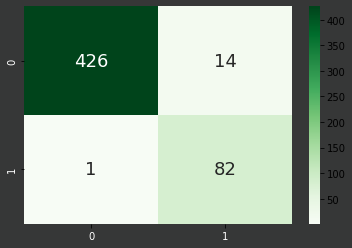

In [ ]:
#--ensamble model weighted gridsearch--
selected_thr = 0.5
# Confusion Matrix
CMfens = confusion_matrix(y_valens,y_pred_multibranch_valens2>=selected_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMfens, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### **sensitivity, precision, accuracy, f1 score**


In [ ]:
#--ensamble model weighted gridsearch--
tn, fp, fn, tp = CMfens.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_multibranch_valens2>=selected_thr)
f1 = f1_score(y_valens,y_pred_multibranch_valens2>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

426
14
1
82
Acc: 0.97131931166348
f1 score: 0.9162011173184358
(Se,Pr)=(0.99,0.85)


#### **Curves PRC and ROC**

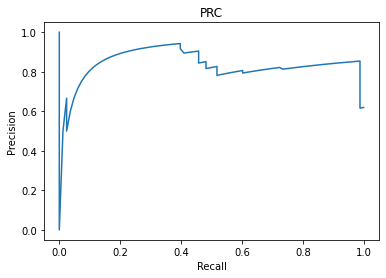

AUPRC TEST-SET : 0.8286


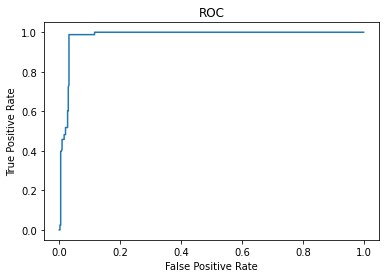

AUROC: 0.9809


In [ ]:
#--ensamble model weighted gridsearch--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_multibranch_valens2)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_multibranch_valens2)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### Gridsearch of best weights for each architecture (use all 3 here)
and maximize f1 score since the best ensembles are the previous one and the one computing the weights based on f1 score in val set so here we combine both concepts.
But performance worsens: this proves that using only the 2 best models is what truly allows to obtain better results 

In [ ]:
# FOR LOOP TO SEARCH THE BEST COMBINATION OF WEIGHTS 
FTmatrix_val3= np.concatenate((y_pred_val12.reshape(-1,1),y_pred_val22.reshape(-1,1),y_pred_val32.reshape(-1,1)),axis=1) #use validation set for training
best = [0, 0,0]
f1_max = 0
for a in values_grid:
  for b in values_grid:
    for c in values_grid:
      if(a+b+c == 1):
        y_pred = prediction(FTmatrix_val3, a, b,c);
        y_pred = np.asarray(y_pred)
        f1val = f1_score(y_val,y_pred>=0.5)
        if(f1val > f1_max): 
          f1_max = f1val
          best[0] = a
          best[1] = b
          best[2] = c


print(best)

[0.01, 0.9600000000000001, 0.03]


In [ ]:
# derive the  weighted predicted probabilities
#evaluate performances on valens set
y_pred_multibranch_valens3 = prediction(FTmatrix_train3, best[0], best[1], best[2])
y_pred_multibranch_valens3 = np.asarray(y_pred_multibranch_valens3)[:]

#### Confusion Matrix

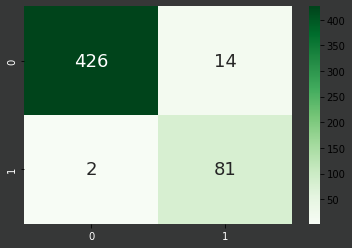

In [ ]:
#--ensamble model weighted gridsearch--
selected_thr = 0.5
# Confusion Matrix
CMfens = confusion_matrix(y_valens,y_pred_multibranch_valens3>=selected_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMfens, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model weighted gridsearch--
tn, fp, fn, tp = CMfens.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_multibranch_valens3>=selected_thr)
f1 = f1_score(y_valens,y_pred_multibranch_valens3>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

426
14
2
81
Acc: 0.9694072657743786
f1 score: 0.9101123595505617
(Se,Pr)=(0.98,0.85)


#### Curves PRC and ROC

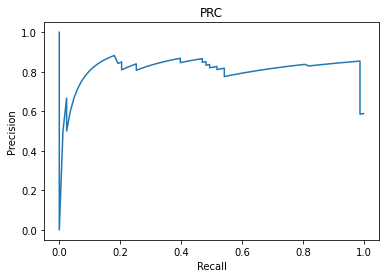

AUPRC TEST-SET : 0.8094


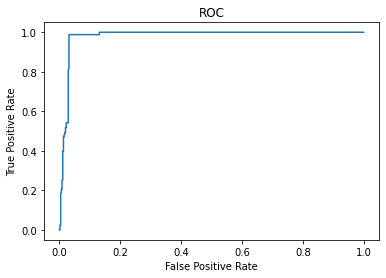

AUROC: 0.9794


In [ ]:
#--ensamble model weighted gridsearch--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_multibranch_valens3)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_multibranch_valens3)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### Combine optimizing prediction threshold 

In [ ]:
 f1_max = 0
for thr in values_grid:
    y_pred = prediction2(FTmatrix_val2, 1./3, 1./3)
    y_pred = np.asarray(y_pred)
    f1val = f1_score(y_val,y_pred>=thr)
    if(f1val > f1_max):
        f1_max = f1val
        best_thr=thr

print(best_thr)

0.36000000000000004


In [ ]:
y_pred_valens_t2 = prediction2(FTmatrix_train2, 1./3, 1./3)
y_pred_valens_t2 = np.asarray(y_pred_valens_t2)[:]

#### Confusion Matrix

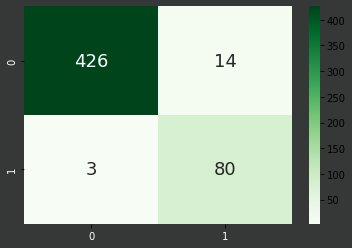

In [ ]:
# Confusion Matrix --best pred thr--
CMft = confusion_matrix(y_valens,y_pred_valens_t2>=best_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMft, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model, best pred thr--
tn, fp, fn, tp = CMft.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_t2>=best_thr)
f1 = f1_score(y_valens,y_pred_valens_t2>=best_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

426
14
3
80
Acc: 0.9674952198852772
f1 score: 0.903954802259887
(Se,Pr)=(0.96,0.85)


#### Curves PRC and ROC

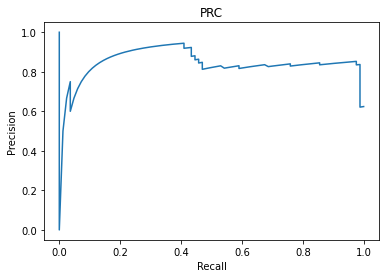

AUPRC TEST-SET : 0.8369


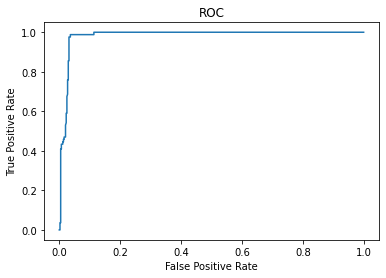

AUROC: 0.9821


In [ ]:
#--ensamble model, best pred thr--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_t2)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_t2)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### Ensamble combining the 2 archis' outputs weighted by own f1 on val

In [ ]:
selected_thr=0.5
f1val1 = f1_score(y_val,y_pred_val12>=selected_thr)
f1val2 = f1_score(y_val,y_pred_val22>=selected_thr)

f1val1,f1val2

(0.8601036269430052, 0.8983050847457626)

In [ ]:
#on validation set for ensamble methods
summ=f1val1+f1val2
w1=f1val1/summ
w2=f1val2/summ

y_pred_fens2 = prediction2(FTmatrix_train2, w1, w2)
y_pred_fens2 = np.asarray(y_pred_fens2)[:]

#### Confusion Matrix

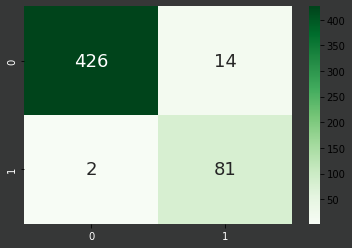

In [ ]:
#--ensamble model weighted on f1score--
selected_thr = 0.5
# Confusion Matrix
CMfens = confusion_matrix(y_valens,y_pred_fens2>=selected_thr) #y_valens or valens_labels(1 hot)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMfens, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--ensamble model weighted on f1score--
tn, fp, fn, tp = CMfens.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_fens2>=selected_thr)
f1 = f1_score(y_valens,y_pred_fens2>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

426
14
2
81
Acc: 0.9694072657743786
f1 score: 0.9101123595505617
(Se,Pr)=(0.98,0.85)


#### Curves PRC and ROC

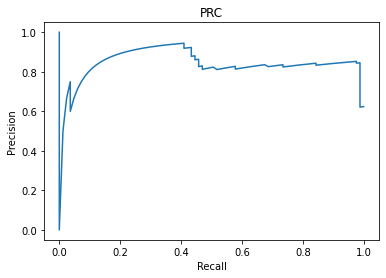

AUPRC TEST-SET : 0.8359


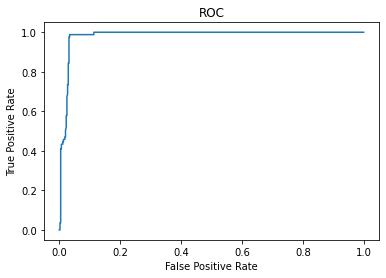

AUROC: 0.9819


In [ ]:
#--ensamble model weighted on f1score--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_fens2)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_fens2)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

### decision tree and logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
X_train= FTmatrix_val2
Y_train= y_val
X_test= FTmatrix_train2
Y_test= y_valens

def hyperp_search(classifier, parameters):
    gs = GridSearchCV(classifier, parameters, cv=2, scoring = 'f1', verbose=3)
    gs = gs.fit(X_train, Y_train)
    f1_train = gs.best_score_
    print("f1_train: %f using %s" % (f1_train, gs.best_params_))

    best_model = gs.best_estimator_
    y_tr_pred= best_model.predict(X_train)
    y_pred = best_model.predict(X_test)
    f1_test = f1_score(Y_test, y_pred)
    print("f1_test: ", f1_test)
    
    print(confusion_matrix(Y_test, y_pred))

    print("acc_train: ", accuracy_score(Y_train, y_tr_pred))
    print("acc_test: ", accuracy_score(Y_test, y_pred))
    print("precision_train: ", precision_score(Y_train, y_tr_pred))
    print("precision_test: ", precision_score(Y_test, y_pred))
    print("recall_train: ", recall_score(Y_train, y_tr_pred))
    print("recall_test: ", recall_score(Y_test, y_pred))
    
    return (best_model)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier()
parameters = {'criterion': ['entropy'],'max_depth': [1,2,3,4],'min_samples_split': [3,5],'min_samples_leaf': [3,5]}

best_tree = hyperp_search(classifier,parameters)

Fitting 2 folds for each of 16 candidates, totalling 32 fits
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=3;, score=0.939 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=3;, score=0.811 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=5;, score=0.939 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=3, min_samples_split=5;, score=0.811 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=3;, score=0.939 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=3;, score=0.811 total time=   0.0s
[CV 1/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=5;, score=0.939 total time=   0.0s
[CV 2/2] END criterion=entropy, max_depth=1, min_samples_leaf=5, min_samples_split=5;, score=0.811 total time=   

In [ ]:
from sklearn import tree
r = tree.export_text(best_tree)
print(r) 

|--- feature_1 <= 0.50
|   |--- feature_0 <= 0.50
|   |   |--- feature_1 <= 0.12
|   |   |   |--- class: 0
|   |   |--- feature_1 >  0.12
|   |   |   |--- class: 0
|   |--- feature_0 >  0.50
|   |   |--- feature_1 <= 0.09
|   |   |   |--- class: 1
|   |   |--- feature_1 >  0.09
|   |   |   |--- class: 0
|--- feature_1 >  0.50
|   |--- feature_1 <= 0.77
|   |   |--- feature_0 <= 0.99
|   |   |   |--- class: 1
|   |   |--- feature_0 >  0.99
|   |   |   |--- class: 0
|   |--- feature_1 >  0.77
|   |   |--- feature_0 <= 0.98
|   |   |   |--- class: 1
|   |   |--- feature_0 >  0.98
|   |   |   |--- class: 1



In [ ]:
#install graphviz https://graphviz.gitlab.io/download/

import sys
!conda install --yes --prefix {sys.prefix} graphviz
!{sys.executable} -m pip install graphviz

/bin/bash: conda: command not found


In [ ]:
from sklearn.tree import export_graphviz
export_graphviz(best_tree, out_file='decision_tree.dot', feature_names = ["Archi1","Archi2"])

In [ ]:
!dot -Tpng decision_tree.dot -o decision_tree.png -Gdpi=600

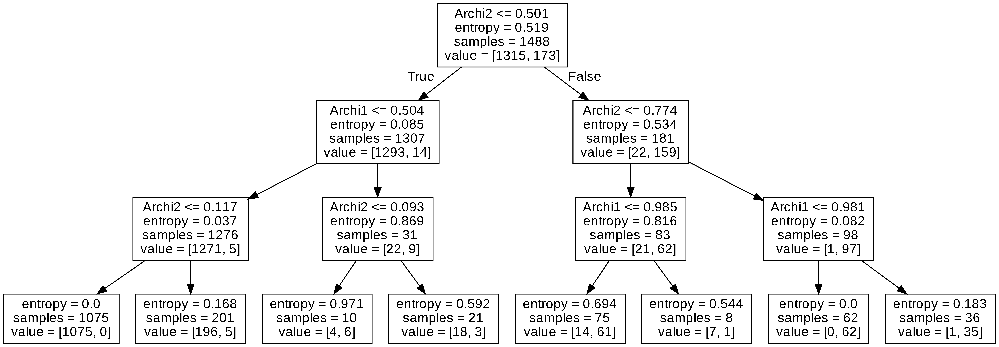

In [ ]:
from IPython.display import Image
Image(filename = 'decision_tree.png')

In [ ]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression()
parameters = {"C":[1e-3,1e-2,1e-1,1,10], "max_iter":[1000,2000], "tol": [1e-4,1e-5]} #C regulates the trade off between generalization (given by the regularization term) and the loss function (minimising the error) so a higher C may cause overfitting

best_logisticReg = hyperp_search(classifier,parameters)

Fitting 2 folds for each of 20 candidates, totalling 40 fits
[CV 1/2] END C=0.001, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END C=0.001, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.001, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.001, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2] END C=0.001, max_iter=2000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END C=0.001, max_iter=2000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.001, max_iter=2000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.001, max_iter=2000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2] END .C=0.01, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2] END .C=0.01, max_iter=1000, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2] END ..C=0.01, max_iter=1000, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2] END ..C=0.01, max_iter=1000, tol=1e-05;

In [ ]:
best_logisticReg.coef_

array([[3.34153865, 6.56247829]])

## MobileNet (only 2 slices around the central one) transfer learning and fine tuning (combined)


In [ ]:
#done to prove the 3D approach (using more slices) performs better 
#even if it does not alloe to use techniques such as transfer learning and fine tuning since there are no available models in literature
def imageLoader_3ch(files, idx_samples,target, batch_size):
    L = len(idx_samples)
    #random.shuffle(idx_samples)
    
    print(idx_samples.shape)
    idx_samples = K.print_tensor(idx_samples)
    np.random.shuffle(idx_samples)
     
    while True:
        batch_start = 0
        batch_end = batch_size

        while batch_end <= L:
            limit = min(batch_end, L)

            # we have to allocate in advance the space for the input batch
            tmpB = np.empty((limit-batch_start,3,40,40)) #<------------------------------------------------------------------ARCHI 3 SHAPE
            tmpB_Y = np.empty((limit-batch_start,2))
            
            idx =-1
            for i in range(batch_start,limit):
                idx=idx+1
                # Ranges has to be updated according to the input size we are dealing with
                # Limitation: only the center is considered, what if nodule at border

                img_0 =  np.expand_dims(files.root.images[idx_samples[i,0],12:15,:,:],axis=0) #<----------------------------------ARCHI 3 CENTER
                
                # image processing
                img_0 = normalize(img_0)
                # from the value in the second column verify which transformation apply 
                angle = idx_samples[i,1]
                if angle == 1:
                    img = np.flip(img_0,axis=3) # horizontal FLIP 
                elif angle ==2:
                    img = np.flip(img_0,axis=2) # vertical FLIP 
                elif angle >2 :
                    img = ndimage.rotate(img_0,angle,reshape=False,mode='constant',axes = (2,3))
                elif angle == 0: # original image is considered
                    img = img_0
                # fill the allocated vector with the tranformed image
                tmpB[idx,:,:,:] =img

                tmpB_Y[idx,:] = target[idx_samples[i,0],:]

            X = np.expand_dims(tmpB,axis=-1)
            Y = tmpB_Y           
            
            #SINGLE INPUT- SINGLE OUTPUT
            yield (X,Y) #a tuple with two numpy arrays with batch_size samples     
            
            batch_start += batch_size   
            batch_end += batch_size

In [ ]:
img_0 =  np.expand_dims(h5file.root.images[0,13,:,:],axis=0)
img_0.shape
img_0=np.reshape(img_0, (40,40))
img_0.shape

(40, 40)

In [ ]:
from keras import models
from keras import layers
input_shape=(3,40,40)

def build_model (input_shape):
    keras.backend.set_image_data_format('channels_first')
    input_layer = layers.Input(shape=input_shape)

    
    rescaleL=layers.Rescaling(scale=2., offset=-1)(input_layer) #input values between -1 and 1

    main=keras.applications.mobilenet.MobileNet(
    input_shape=input_shape,alpha=1.0, depth_multiplier=1, dropout=0.4,
    include_top=False, weights='imagenet', pooling="max" #the use of imagenet weights for FP reduction in lung nodules detection was found in literature but only for a 2D approach, here 3 different slices are used instead of replicating only one
    )(rescaleL)
    main.trainable=False
    classifier=layers.Dropout(0.4, seed=seed)(main)
    classifier=layers.Dense(units=240, kernel_initializer=keras.initializers.GlorotUniform(seed), activation='relu')(classifier) 
    classifier=layers.Dropout(0.4, seed=seed)(classifier)
    output_layer=layers.Dense(units=2, activation='softmax', kernel_initializer=keras.initializers.GlorotUniform(seed))(classifier)
    model = keras.Model(inputs=input_layer, outputs=output_layer, name= my_model_name)
    model.compile(loss=custom_crossentropy(bce), optimizer=adam, metrics=['acc',recall,precision,f1score])
    return model
model=build_model(input_shape)

In [ ]:
model.summary()

Model: "multimodal_conv"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_35 (InputLayer)       [(None, 3, 40, 40)]       0         
                                                                 
 rescaling_6 (Rescaling)     (None, 3, 40, 40)         0         
                                                                 
 mobilenet_1.00_224 (Functio  (None, 1024)             3228864   
 nal)                                                            
                                                                 
 dropout_29 (Dropout)        (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 240)               246000    
                                                                 
 dropout_30 (Dropout)        (None, 240)               0         
                                                   

In [ ]:
training_generator3ch = imageLoader_3ch(h5file, idx_angles_training, y, batch_size)

In [ ]:
valens_images_ch3_new=[]
valens_images_ch3 =  np.expand_dims(h5file.root.images[list(idx_valens),12:15,:,:],axis=-1) 
valens_images_ch3 = normalize(valens_images_ch3)  
   
print(np.shape(valens_images_ch3))

/usr/local/lib/python3.7/dist-packages/tables/leaf.py:548: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  key = numpy.array(key)


(523, 3, 40, 40, 1)


Epoch 1/50
76/76 [==============================] - 75s 958ms/step - loss: 1.3757 - acc: 0.5995 - recall: 0.4937 - precision: 0.5364 - f1score: 0.5061 - val_loss: 0.6713 - val_acc: 0.6042 - val_recall: 0.3511 - val_precision: 0.1799 - val_f1score: 0.2193 - lr: 1.0000e-05
Epoch 2/50
76/76 [==============================] - 35s 465ms/step - loss: 0.8356 - acc: 0.7191 - recall: 0.6584 - precision: 0.6847 - f1score: 0.6669 - val_loss: 0.6483 - val_acc: 0.6195 - val_recall: 0.4481 - val_precision: 0.1914 - val_f1score: 0.2539 - lr: 1.0000e-05
Epoch 3/50
76/76 [==============================] - 35s 470ms/step - loss: 0.6473 - acc: 0.7751 - recall: 0.7300 - precision: 0.7463 - f1score: 0.7351 - val_loss: 0.6288 - val_acc: 0.6558 - val_recall: 0.5108 - val_precision: 0.2533 - val_f1score: 0.3140 - lr: 1.0000e-05
Epoch 4/50
76/76 [==============================] - 16s 216ms/step - loss: 0.5277 - acc: 0.8062 - recall: 0.7661 - precision: 0.7843 - f1score: 0.7719 - val_loss: 0.6693 - val_acc: 0.6

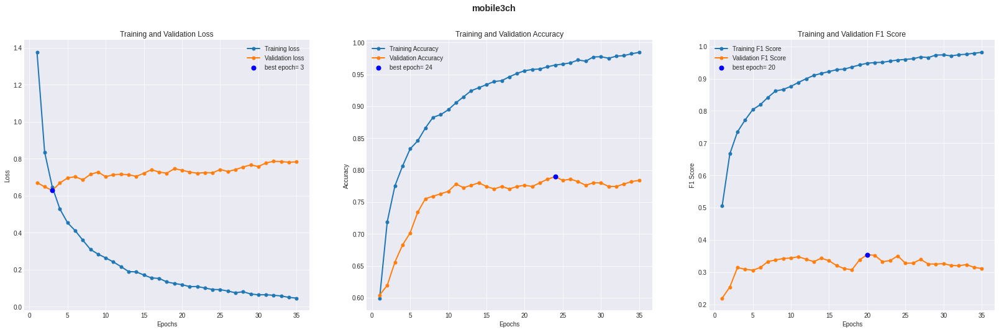

In [ ]:
my_model_name='mobile3ch'
(my_callbacks, exp_dir) = create_folders_and_callbacks(model_name=my_model_name)
historym = model.fit( x=training_generator3ch,   
          validation_data = (valens_images_ch3,valens_labels), 
          epochs = epochs, steps_per_epoch = steps,
          callbacks=my_callbacks
          )

#Plot
resume_plot(historym, exp_dir, my_model_name)
#Animation
animated_plot(historym, repeat_animation=False)

In [ ]:
#similarly to resnet the main issue was  overfitting, perhaps a finer tuning after training on the Luna 16 dataset might help
model.save(os.path.join(exps_dir, str('best_model/' +  my_model_name)))

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/mobile3ch/assets


In [ ]:
#model=keras.models.load_model("/content/gdrive/MyDrive/StudentsFolder/model_seba_neuro/EnsembleModels/best_model/mobile3ch", custom_objects={"f1score":f1score,"recall":recall,"precision":precision}, compile=True, options=None)

### Prediction on valens dataset

In [ ]:
y_pred_valens_m = model.predict(valens_images_ch3)
y_pred_valens_m = np.asarray(y_pred_valens_multi_c)

#### Confusion Matrix

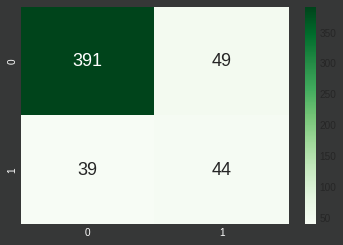

In [ ]:
#--Multimodal model--
selected_thr = 0.5
# Confusion Matrix
CMm = confusion_matrix(y_valens,y_pred_valens_m>=selected_thr)
fig = plt.figure()
fig.set_facecolor('xkcd:dark grey')
ax = sn.heatmap(CMm, annot=True, annot_kws={"size": 18}, fmt='g', cmap=plt.cm.Greens) # font size
plt.xticks(color='white')
plt.yticks(color = 'white')
plt.show()
#fig.savefig(os.path.join(graph, '/confusion_matrix.png'), facecolor=fig.get_facecolor() )

#### sensitivity, precision, accuracy, f1 score


In [ ]:
#--multimodal model--
tn, fp, fn, tp = CMm.ravel()
print(tn)
print(fp)
print(fn)
print(tp)
Se = round(tp/(tp+fn),2)
Pr = round(tp/(tp+fp),2)
acc = accuracy_score(y_valens,y_pred_valens_m>=selected_thr)
f1 = f1_score(y_valens,y_pred_valens_m>=selected_thr)
print(f'Acc: {acc}')
print(f'f1 score: {f1}')
print("(Se,Pr)=("+str(Se)+","+str(Pr)+")")

391
49
39
44
Acc: 0.8317399617590823
f1 score: 0.5000000000000001
(Se,Pr)=(0.53,0.47)


## **Curves PRC and ROC**

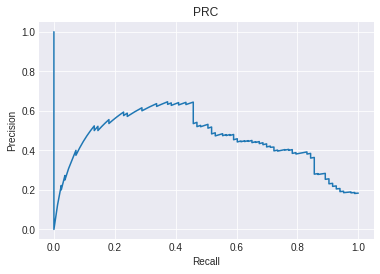

AUPRC TEST-SET : 0.4483


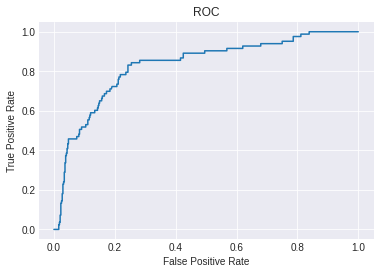

AUROC: 0.8288


In [ ]:
#--multimodal model--
# Compute PRC
prec, rec, thr_auprc=precision_recall_curve(y_valens,y_pred_valens_m)
fig, ax = plt.subplots()
plt.plot(rec,prec)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PRC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'PRC_NO_RES'))
print("AUPRC TEST-SET : "+str(round(auc(rec,prec),4)))

# Compute ROC
fpr, tpr, thr_auc=roc_curve(y_valens,y_pred_valens_m)
fig, ax = plt.subplots()
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()
#fig.savefig(os.path.join(FOLDER, 'AUROC_NO_RES'))
print('AUROC: '+ str(round(auc(fpr,tpr),4)))

# **Best model**
The best performing model that is selected to be tested on new data is the ensemble obtained by gridsearching the best weights to be assigned to archi 1 and 2 's predictions when linearly combined in order to obtain the best aupr, with archi 1 and 2 trained on advanced augmentation 9-1

# **Future developments**
* Pretrain the networks on the more abundant LUNA16 dataset and then apply transfer learning or fine tuning using the given dataset
* A limitations of the centerwise cropping of the original image approach is that if the lesion is not at the ROI's center but at a border it is getting at least partially excluded from the input which will be fed to each network; so if the information regarding the probable center of the lesion is not made available by the ROI proposal phase of lung nodule detection, a possible solution could be that of cropping the original image more times, with different centers and feeding them to the network, and then taking
as prediction the one given with the most confidence (greatest difference among the probabilities assigned to each class) and with most aggreement among adjacient regions of the original image